In [1]:
from keras import backend as K
from skimage import data, color, io, img_as_float
def get_heatmap(processed_image, class_idx):
    # we want the activations for the predicted label
    class_output = model.output[:, class_idx]
    
    # choose the last conv layer in your model
    last_conv_layer = model.get_layer('bn')
    
    # get the gradients wrt to the last conv layer
    grads = K.gradients(class_output, last_conv_layer.output)[0]
    
   # we pool the gradients over all the axes leaving out the channel dimension
    pooled_grads = K.mean(grads, axis=(0,1,2))
    
    # Define a function that generates the values for the output and gradients
    iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])
    grads_values, conv_ouput_values = iterate([processed_image])
    for i in range(512): # we have 512 features in our last conv layer
        conv_ouput_values[:,:,i] *= grads_values[i]
    
    # create a heatmap
    heatmap = np.mean(conv_ouput_values, axis=-1)
    
    # remove negative values
    heatmap = np.maximum(heatmap, 0)
    
    # normalize
    heatmap /= heatmap.max()
    
    return heatmap


In [2]:
import importlib
from keras.layers import Input
from keras.layers.core import Dense
from keras.models import Model


class ModelFactory:
    """
    Model facotry for Keras default models
    """

    def __init__(self):
        self.models_ = dict(

            DenseNet121=dict(
                input_shape=(224, 224, 3),
                module_name="densenet",
                last_conv_layer="bn",
            )
            
        )

    def get_last_conv_layer(self, model_name):
        return self.models_[model_name]["last_conv_layer"]

    def get_input_size(self, model_name):
        return self.models_[model_name]["input_shape"][:2]

    def get_model(self, class_names, model_name="DenseNet121", use_base_weights=True,
                  weights_path=None, input_shape=None):

        if use_base_weights is True:
            base_weights = "imagenet"
        else:
            base_weights = None

        base_model_class = getattr(
            importlib.import_module(
                f"keras.applications.{self.models_[model_name]['module_name']}"
            ),
            model_name)

        if input_shape is None:
            input_shape = self.models_[model_name]["input_shape"]

        img_input = Input(shape=input_shape)

        base_model = base_model_class(
            include_top=False,
            input_tensor=img_input,
            input_shape=input_shape,
            weights=base_weights,
            pooling="avg")
        x = base_model.output
        predictions = Dense(len(class_names), activation="sigmoid", name="predictions")(x)
        model = Model(inputs=img_input, outputs=predictions)

        if weights_path == "":
            weights_path = None

        if weights_path is not None:
            print(f"load model weights_path: {weights_path}")
            model.load_weights(weights_path)
        return model

In [3]:
import tensorflow as tf
tf.compat.v1.disable_eager_execution()
import cProfile

In [4]:
import json
import shutil
import os
import pickle

from configparser import ConfigParser

In [5]:
    config_file = "config.ini"
    cp = ConfigParser()
    cp.read(config_file)

    base_model_name = cp["DEFAULT"].get("base_model_name")
    output_weights_name = "best_best_weights1.h5"
    output_dir = cp["DEFAULT"].get("output_dir")
    class_names = cp["DEFAULT"].get("class_names").split(",")
    model_weights_file = r"C:\Users\Vignesh\ML\experiments\6\best_best_weights1.h5"

In [6]:
prediction_labels={}
for i, class_name in enumerate(class_names):
    prediction_labels[class_name] = i
prediction_labels

{'Atelectasis': 0,
 'Cardiomegaly': 1,
 'Effusion': 2,
 'Infiltration': 3,
 'Mass': 4,
 'Nodule': 5,
 'Pneumonia': 6,
 'Pneumothorax': 7,
 'Consolidation': 8,
 'Edema': 9,
 'Emphysema': 10,
 'Fibrosis': 11,
 'Pleural_Thickening': 12,
 'Hernia': 13}

In [24]:
import os
import csv

d = r"C:\Users\Vignesh\ML\data\images"
imfile=[]
count=0
i=1

with open(r"C:\Users\Vignesh\ML\data\BBox_List_2017.csv",'r') as csvfile:
    csvreader = csv.reader(csvfile)
    for row in csvreader:
        if(i==1):
            i=0
            continue
        full_path = os.path.join(d, row[0])
#         print(full_path)
        count +=1
        if os.path.isfile(full_path):
            imfile.append(full_path)
        if count > 100:
            break
print(type(imfile))



<class 'list'>


load model weights_path: C:\Users\Vignesh\ML\experiments\6\best_best_weights1.h5
*********************************************************************************
The image 00013118_008.png
14-DIMENTIONAL Vector of Pathology values :
[0.07991108 0.00342963 0.063274   0.10288617 0.00817114 0.01821492
 0.0044477  0.01032415 0.01563386 0.00530829 0.01831757 0.00424966
 0.00968151 0.00013064]
Actual pathology: Atelectasis
 
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.10288617]
 
*********************************************************************************
The image 00014716_007.png
14-DIMENTIONAL Vector of Pathology values :
[0.14616488 0.00748796 0.27165163 0.08051358 0.12656425 0.02369724
 0.00382777 0.08983932 0.07672846 0.00598263 0.01135126 0.0087521
 0.04492155 0.00083844]
Actual pathology: Atelectasis|Effusion|Mass
 
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.27165163]
The Predicted Label No is 0
Pr

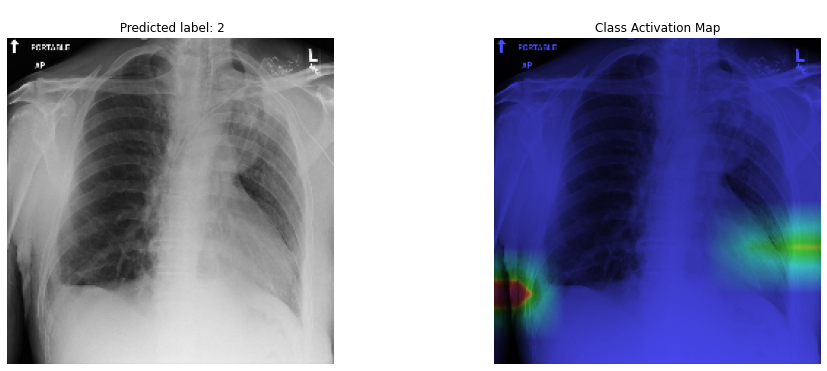

*********************************************************************************
The image 00029817_009.png
14-DIMENTIONAL Vector of Pathology values :
[5.1994130e-02 8.6710299e-04 4.0697567e-02 1.9382864e-01 3.5682379e-03
 7.4419882e-03 4.4649662e-03 1.8450812e-02 4.0008809e-02 6.3324980e-02
 1.4446236e-02 4.5152300e-04 4.0821219e-03 4.4798135e-06]
Actual pathology: Atelectasis
 
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.19382864]
 
*********************************************************************************
The image 00014687_001.png
14-DIMENTIONAL Vector of Pathology values :
[2.5129369e-01 5.8078934e-03 3.4324414e-01 9.8850936e-02 5.0598946e-03
 4.2100926e-03 2.3016164e-03 4.3088205e-02 1.4441466e-01 2.6251152e-03
 5.4864897e-03 4.4175965e-04 8.3089545e-03 4.6230398e-05]
Actual pathology: Atelectasis|Cardiomegaly|Consolidation
 
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.34324414]
The Predicted

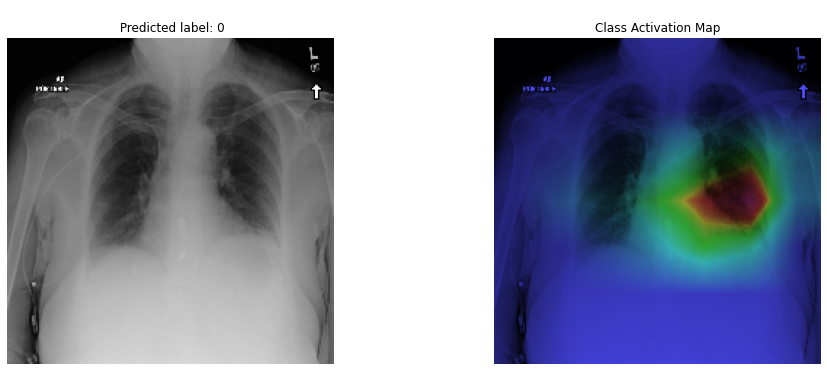

*********************************************************************************
The image 00003148_004.png
14-DIMENTIONAL Vector of Pathology values :
[1.1330849e-01 1.0435650e-03 6.3739382e-02 5.7923645e-02 5.6062392e-03
 3.9185220e-03 9.7485801e-04 3.3864249e-02 2.7286801e-02 1.4741697e-02
 8.4460981e-02 2.3302987e-04 1.8778578e-03 9.4724302e-05]
Actual pathology: Atelectasis
 
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.11330849]
 


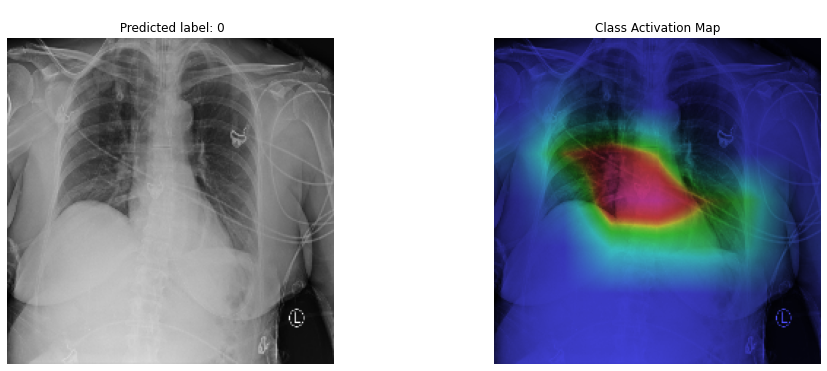

*********************************************************************************
The image 00012515_002.png
14-DIMENTIONAL Vector of Pathology values :
[1.2138249e-01 1.6507336e-03 5.6557253e-02 1.4298767e-01 3.4002974e-03
 6.9207582e-03 3.5973799e-03 5.7876084e-02 5.0042190e-02 1.0951108e-02
 1.3234853e-02 5.2378268e-04 4.1954811e-03 3.7714377e-05]
Actual pathology: Atelectasis
 
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.14298767]
 
*********************************************************************************
The image 00022098_006.png
14-DIMENTIONAL Vector of Pathology values :
[1.6277269e-01 2.8664854e-03 2.9684788e-01 1.5886867e-01 5.0233994e-03
 5.2207126e-03 2.1773246e-03 1.4597456e-02 1.3165997e-01 3.5653214e-03
 8.3034672e-03 1.9376702e-04 6.3397237e-03 4.7955882e-06]
Actual pathology: Atelectasis|Effusion|Infiltration
 
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.29684788]
The Predicted Labe

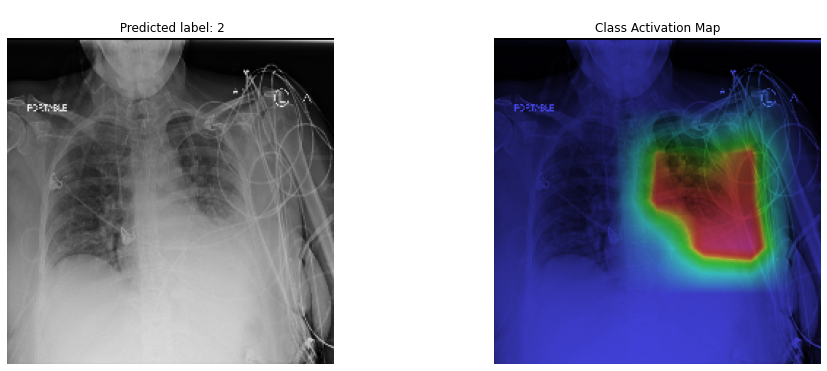

*********************************************************************************
The image 00014198_000.png
14-DIMENTIONAL Vector of Pathology values :
[3.4513123e-02 1.4643038e-03 2.7488690e-02 5.7573132e-02 1.7719908e-02
 1.2217215e-02 2.3169981e-03 1.6186211e-02 2.2150947e-02 3.5162186e-03
 5.2170534e-02 6.3221011e-04 2.1277263e-03 2.4770291e-06]
Actual pathology: Atelectasis|Infiltration|Nodule
 
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.05757313]
The Predicted Label No is 10
Predicted pathology:Emphysema
The value predicted = [0.05217053]
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.03451312]
 


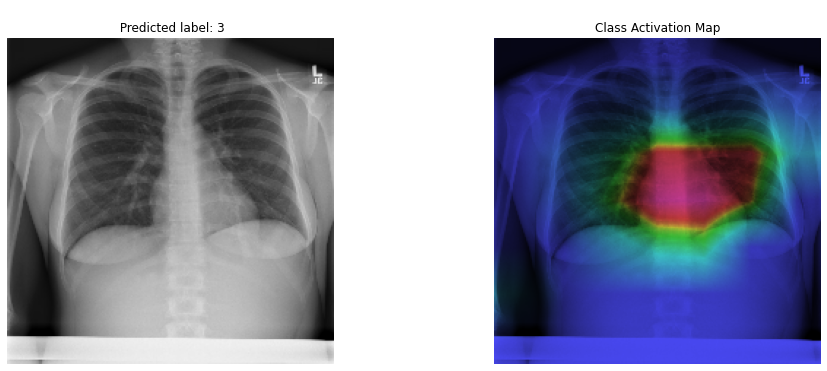

*********************************************************************************
The image 00021007_000.png
14-DIMENTIONAL Vector of Pathology values :
[4.1959066e-02 3.6585220e-04 6.8331979e-02 1.6169852e-01 2.6766418e-02
 2.7676061e-02 8.3100395e-03 1.8543441e-02 7.6079905e-02 1.7332941e-02
 6.4635761e-03 5.0005759e-03 1.1185955e-02 6.9163965e-05]
Actual pathology: Atelectasis|Effusion|Fibrosis
 
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.16169852]
The Predicted Label No is 8
Predicted pathology:Consolidation
The value predicted = [0.07607991]
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.06833198]
 
*********************************************************************************
The image 00030674_000.png
14-DIMENTIONAL Vector of Pathology values :
[8.6585365e-02 1.5398908e-02 8.6132608e-02 6.1554965e-02 1.8371829e-01
 2.0496886e-02 2.3252633e-03 5.3826131e-02 2.1084355e-02 3.2919969e-03
 2.0855375e-02 

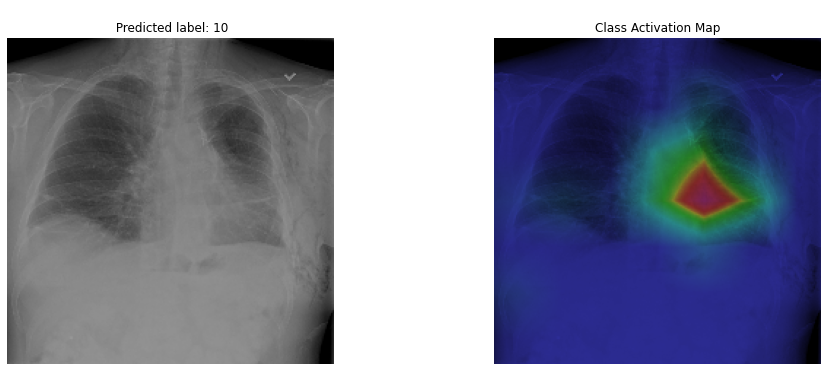

*********************************************************************************
The image 00000808_002.png
14-DIMENTIONAL Vector of Pathology values :
[3.0943745e-01 9.0705827e-03 6.8112808e-01 1.4853451e-01 1.2579060e-02
 5.5429577e-03 6.0839602e-03 5.4361645e-02 1.9650908e-01 2.2804379e-03
 1.1253179e-02 5.5099907e-04 4.5005647e-03 1.8859578e-04]
Actual pathology: Atelectasis|Consolidation|Effusion
 
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.6811281]
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.30943745]
The Predicted Label No is 8
Predicted pathology:Consolidation
The value predicted = [0.19650908]
 


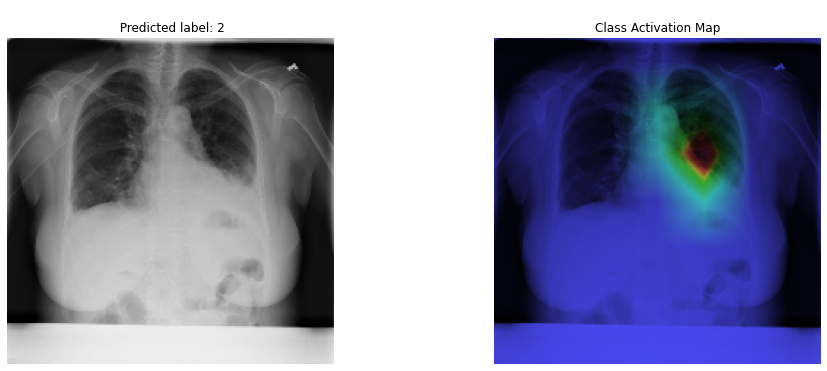

*********************************************************************************
The image 00006621_004.png
14-DIMENTIONAL Vector of Pathology values :
[3.4513092e-01 6.2669474e-03 4.1823342e-01 1.5567908e-01 5.8495309e-03
 2.7741876e-03 2.6138492e-03 1.2334380e-02 1.7361237e-01 7.9198470e-03
 7.3176357e-03 1.3366195e-04 2.0331184e-03 3.1426269e-05]
Actual pathology: Atelectasis|Consolidation|Effusion
 
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.41823342]
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.34513092]
The Predicted Label No is 8
Predicted pathology:Consolidation
The value predicted = [0.17361237]
 


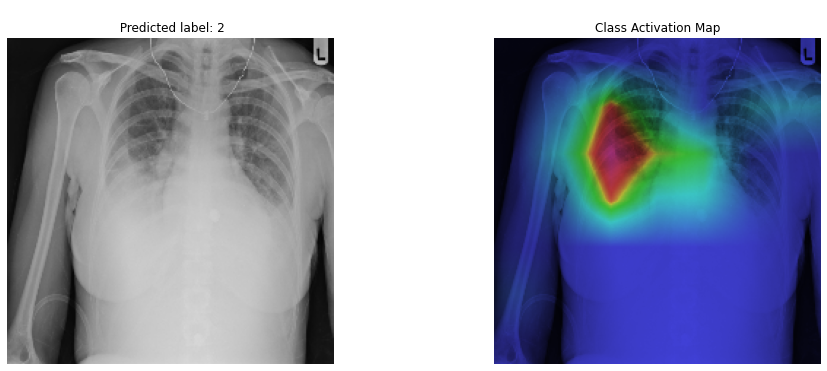

*********************************************************************************
The image 00000865_006.png
14-DIMENTIONAL Vector of Pathology values :
[5.1295187e-02 4.1701910e-04 4.9705752e-03 9.8359868e-02 1.0598497e-02
 2.4146663e-02 5.5493088e-03 5.3052455e-03 1.6505521e-02 1.1954095e-02
 1.1213067e-03 1.5640880e-03 4.5227776e-03 1.2938873e-05]
Actual pathology: Atelectasis
 
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.09835987]
 
*********************************************************************************
The image 00028452_001.png
14-DIMENTIONAL Vector of Pathology values :
[1.9740528e-01 2.0834762e-03 1.5945020e-01 4.7447156e-02 2.6386180e-03
 2.8439995e-03 9.8226161e-04 3.3023410e-02 6.8443522e-02 1.8915641e-03
 4.6313750e-03 2.9137230e-04 3.6103553e-03 4.0613744e-05]
Actual pathology: Effusion|Infiltration|Atelectasis
 
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.19740528]
The Predicted L

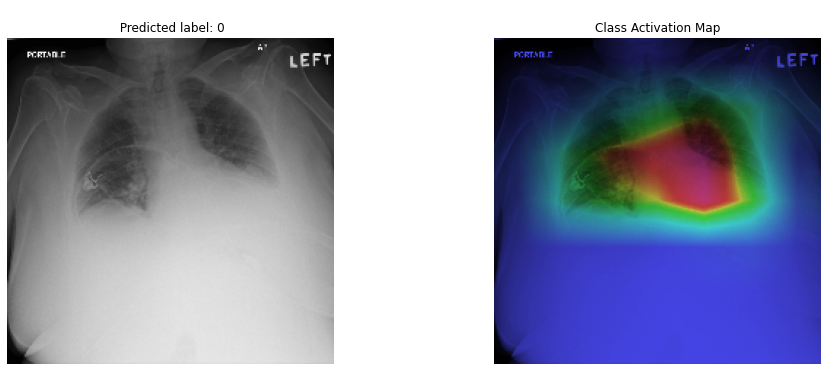

*********************************************************************************
The image 00007557_026.png
14-DIMENTIONAL Vector of Pathology values :
[2.0088631e-01 4.3690456e-03 4.9655455e-01 1.3215445e-01 1.3678433e-02
 7.0608333e-03 5.0478326e-03 1.2316966e-02 6.1529219e-02 8.3007822e-03
 8.6111370e-03 8.2880928e-04 1.2723954e-02 3.9495731e-05]
Actual pathology: Atelectasis|Effusion|Infiltration
 
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.49655455]
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.20088631]
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.13215445]
 


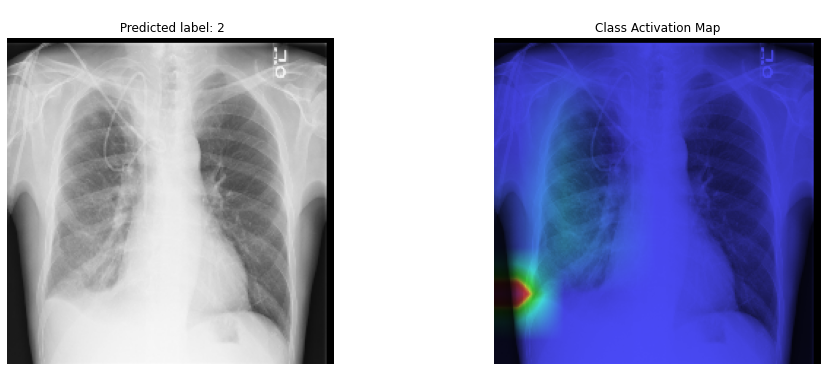

*********************************************************************************
The image 00000181_061.png
14-DIMENTIONAL Vector of Pathology values :
[1.2381907e-01 2.6420522e-03 3.5038871e-01 8.5168794e-02 1.4982032e-02
 1.1518173e-02 2.1430738e-03 1.3032636e-01 4.0519599e-02 2.7899805e-02
 7.9423048e-02 1.7355176e-03 1.6809966e-02 1.3859595e-04]
Actual pathology: Atelectasis|Effusion|Infiltration
 
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.3503887]
The Predicted Label No is 7
Predicted pathology:Pneumothorax
The value predicted = [0.13032636]
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.12381907]
 


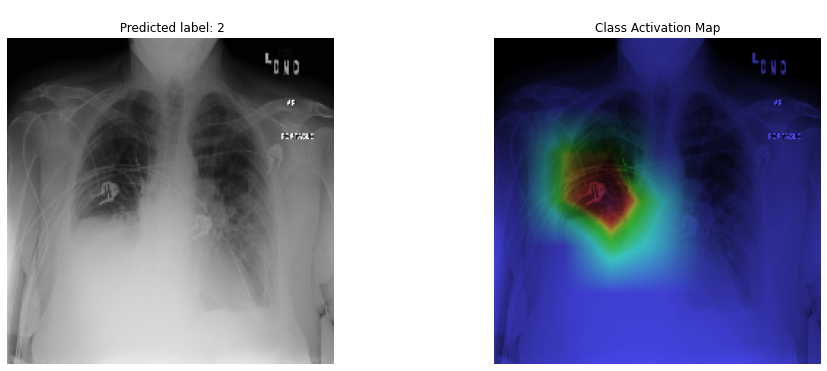

*********************************************************************************
The image 00009669_003.png
14-DIMENTIONAL Vector of Pathology values :
[2.9418555e-01 1.8437488e-02 5.4990309e-01 1.0699098e-01 3.2902889e-02
 1.1277499e-02 4.9384725e-03 4.5346666e-02 8.5876636e-02 3.4430020e-03
 1.8563325e-02 5.2327742e-03 3.7919659e-02 2.8598108e-04]
Actual pathology: Atelectasis|Effusion|Infiltration|Mass
 
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.5499031]
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.29418555]
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.10699098]
The Predicted Label No is 8
Predicted pathology:Consolidation
The value predicted = [0.08587664]
 


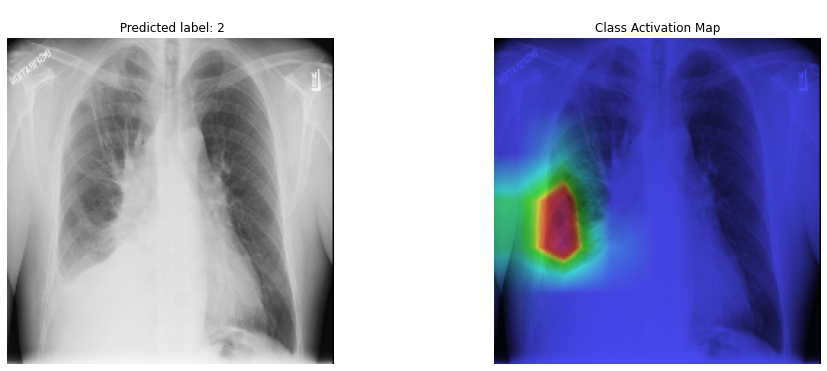

*********************************************************************************
The image 00025368_014.png
14-DIMENTIONAL Vector of Pathology values :
[1.4707030e-01 1.6901611e-03 5.0869171e-02 2.0240951e-01 3.0786553e-02
 2.4406139e-02 8.8514527e-03 3.0081251e-01 5.6238141e-02 1.9901956e-02
 2.3613883e-02 7.1656145e-04 5.5150897e-03 4.1592099e-05]
Actual pathology: Atelectasis|Infiltration|Nodule|Pneumothorax
 
The Predicted Label No is 7
Predicted pathology:Pneumothorax
The value predicted = [0.3008125]
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.2024095]
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.1470703]
The Predicted Label No is 8
Predicted pathology:Consolidation
The value predicted = [0.05623814]
 


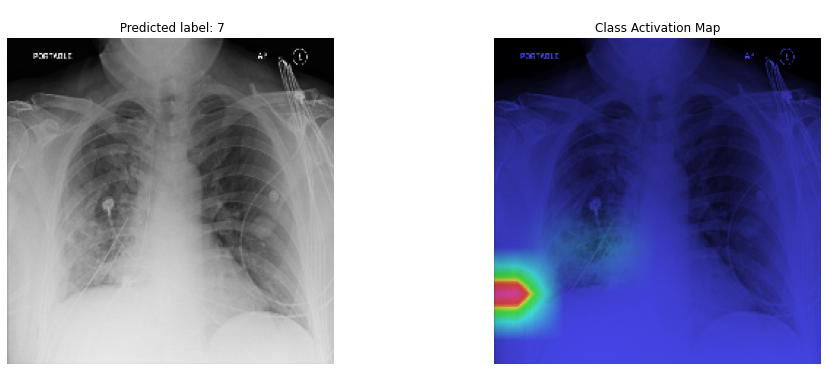

*********************************************************************************
The image 00000468_033.png
14-DIMENTIONAL Vector of Pathology values :
[4.0067278e-02 1.9327069e-02 6.9711387e-02 1.3419491e-01 9.0918820e-03
 1.8176740e-02 4.0778359e-03 2.6129013e-02 1.6881421e-02 5.5870498e-03
 2.3718594e-02 2.2615916e-03 3.3239223e-02 1.0559000e-06]
Actual pathology: Atelectasis
 
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.13419491]
 
*********************************************************************************
The image 00010770_000.png
14-DIMENTIONAL Vector of Pathology values :
[0.25786564 0.01146606 0.0400236  0.05618526 0.01009329 0.00901561
 0.00322349 0.00933017 0.02029361 0.00167961 0.00365225 0.00389536
 0.01092526 0.0006287 ]
Actual pathology: Atelectasis|Cardiomegaly|Pleural_Thickening
 
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.25786564]
The Predicted Label No is 3
Predicted pathology

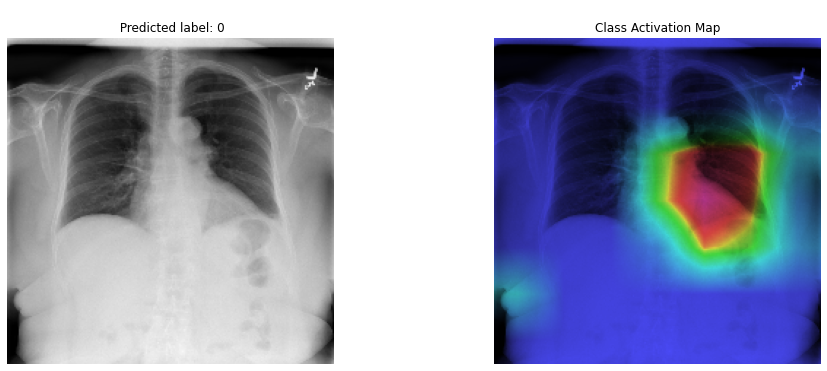

*********************************************************************************
The image 00016972_019.png
14-DIMENTIONAL Vector of Pathology values :
[1.2279345e-01 8.3706155e-03 2.5854558e-01 1.5729395e-01 4.1527124e-03
 7.0110387e-03 4.4296584e-03 5.0321061e-02 1.4179061e-01 3.7639480e-02
 7.9555456e-03 1.2172851e-03 5.7437019e-03 5.7706988e-05]
Actual pathology: Atelectasis|Effusion|Infiltration
 
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.25854558]
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.15729395]
The Predicted Label No is 8
Predicted pathology:Consolidation
The value predicted = [0.14179061]
 


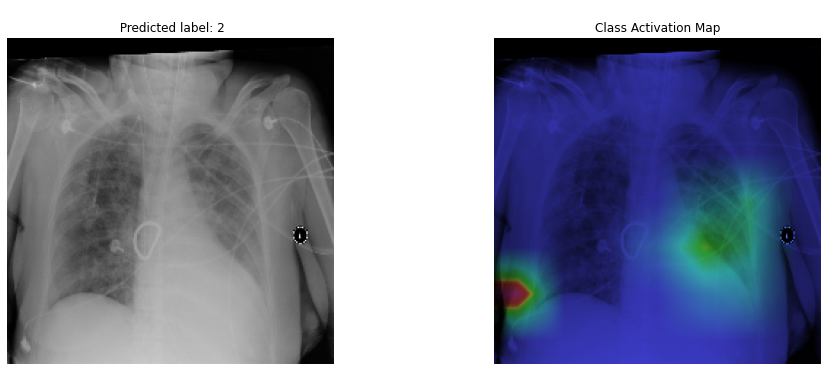

*********************************************************************************
The image 00030635_001.png
14-DIMENTIONAL Vector of Pathology values :
[1.5855314e-01 1.1528998e-03 4.4269985e-01 6.2763654e-02 1.7879475e-02
 1.9409290e-02 2.0848936e-03 8.0824167e-02 6.1850112e-02 1.7024177e-03
 1.0235082e-02 1.2564851e-03 1.8512081e-02 4.0713014e-05]
Actual pathology: Atelectasis|Effusion
 
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.44269985]
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.15855314]
 


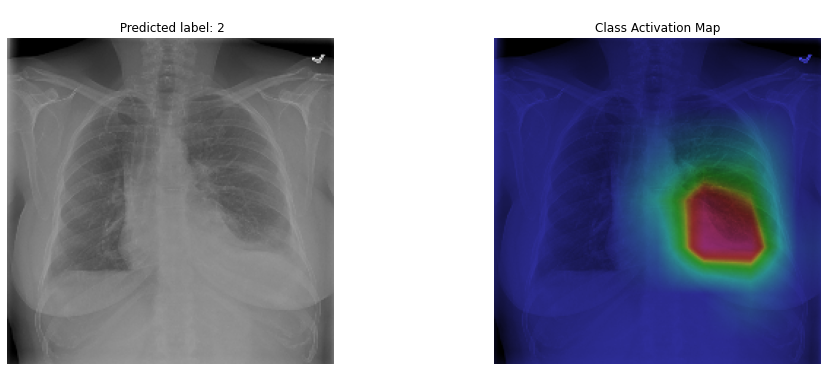

*********************************************************************************
The image 00021481_014.png
14-DIMENTIONAL Vector of Pathology values :
[2.4128717e-01 3.8996038e-03 3.1870905e-01 9.6041314e-02 8.7813251e-03
 8.9107351e-03 2.4987271e-03 2.0837445e-02 7.6017588e-02 4.0469333e-03
 9.7263670e-03 1.6360390e-03 1.7762402e-02 6.8870562e-05]
Actual pathology: Atelectasis|Effusion|Infiltration
 
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.31870905]
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.24128717]
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.09604131]
 


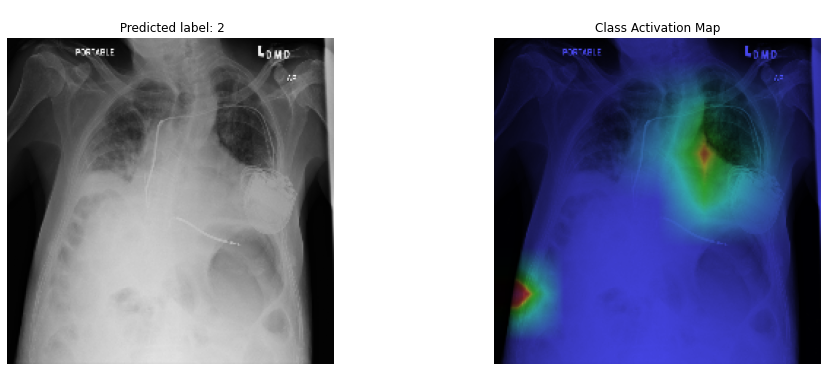

*********************************************************************************
The image 00019124_045.png
14-DIMENTIONAL Vector of Pathology values :
[7.72584155e-02 2.81163398e-03 1.42436862e-01 3.56687844e-01
 2.55443212e-02 3.76255177e-02 1.52061069e-02 6.80105239e-02
 1.15895204e-01 7.08402693e-02 3.03411335e-02 3.39888246e-03
 2.25740299e-02 3.78066325e-05]
Actual pathology: Atelectasis|Infiltration|Nodule
 
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.35668784]
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.14243686]
The Predicted Label No is 8
Predicted pathology:Consolidation
The value predicted = [0.1158952]
 


<ipython-input-1-b3bbee3de014>:29: RuntimeWarning: invalid value encountered in true_divide
  heatmap /= heatmap.max()


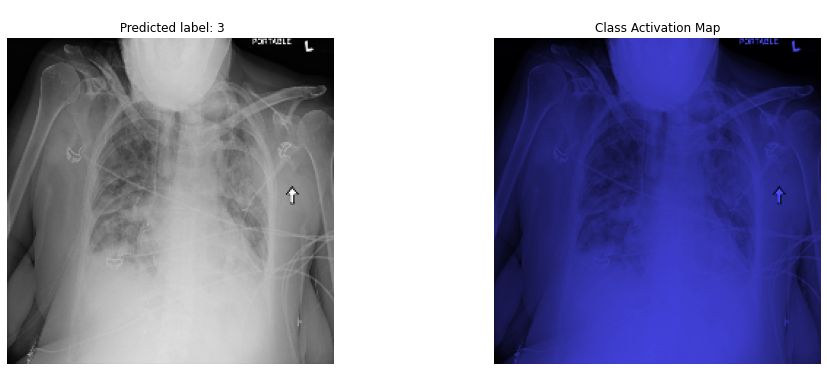

*********************************************************************************
The image 00022883_002.png
14-DIMENTIONAL Vector of Pathology values :
[0.70296866 0.00365503 0.45714954 0.13008586 0.00602262 0.01550518
 0.00755649 0.03090603 0.05321347 0.00100206 0.03623785 0.00402839
 0.01247501 0.00106199]
Actual pathology: Atelectasis|Effusion|Infiltration
 
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.70296866]
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.45714954]
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.13008586]
 


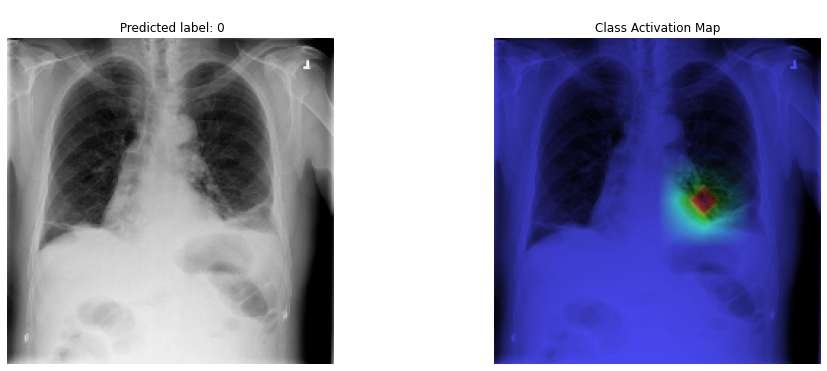

*********************************************************************************
The image 00028173_016.png
14-DIMENTIONAL Vector of Pathology values :
[1.7345886e-01 1.9926804e-03 6.9938414e-02 6.4056300e-02 3.0036061e-03
 2.9669097e-03 1.0133055e-03 5.3468090e-02 5.2831843e-02 1.3282893e-03
 4.4414084e-02 2.3767675e-04 2.4069441e-03 6.2425235e-05]
Actual pathology: Atelectasis|Infiltration
 
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.17345886]
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.06993841]
 


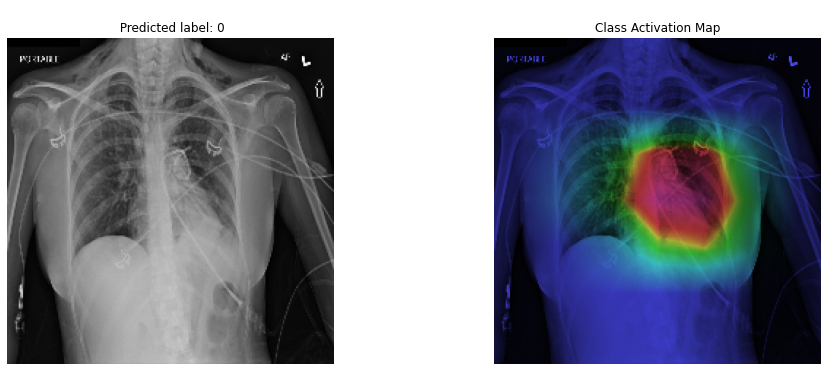

*********************************************************************************
The image 00027094_003.png
14-DIMENTIONAL Vector of Pathology values :
[1.7621493e-02 7.7912916e-04 1.9663105e-02 9.3893602e-02 5.6696096e-03
 1.4478146e-02 2.6016072e-03 1.2568920e-02 1.3679393e-02 1.3737448e-02
 2.1567692e-03 7.3099008e-04 3.6900418e-03 1.9543320e-06]
Actual pathology: Atelectasis|Infiltration
 
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.0938936]
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.0196631]
 


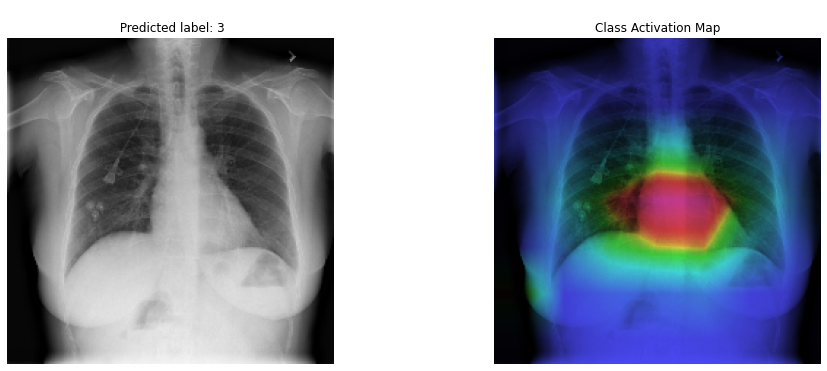

*********************************************************************************
The image 00012123_001.png
14-DIMENTIONAL Vector of Pathology values :
[0.23311366 0.01939652 0.2092941  0.08952326 0.00593054 0.00518739
 0.00365001 0.1344654  0.17403428 0.00275535 0.00834213 0.0015036
 0.01010292 0.00025339]
Actual pathology: Atelectasis|Effusion
 
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.23311366]
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.2092941]
 


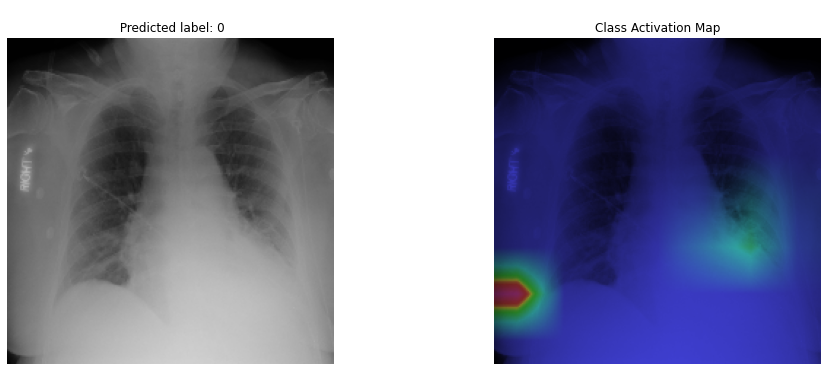

*********************************************************************************
The image 00020113_017.png
14-DIMENTIONAL Vector of Pathology values :
[1.97852165e-01 2.34843069e-03 7.59779274e-01 1.20318756e-01
 6.44941302e-03 4.59772022e-03 1.40064093e-03 1.94020495e-02
 8.60275030e-02 6.69686822e-03 3.55583057e-03 1.75631343e-04
 6.72594784e-03 5.85266343e-06]
Actual pathology: Atelectasis
 
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.7597793]
 
*********************************************************************************
The image 00004968_003.png
14-DIMENTIONAL Vector of Pathology values :
[0.36493668 0.00836698 0.11662728 0.14038812 0.00785725 0.01113287
 0.00843927 0.00453267 0.06436418 0.00639455 0.00701148 0.00297966
 0.00570504 0.00041696]
Actual pathology: Atelectasis|Infiltration
 
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.36493668]
The Predicted Label No is 3
Predicted pathology:Infiltra

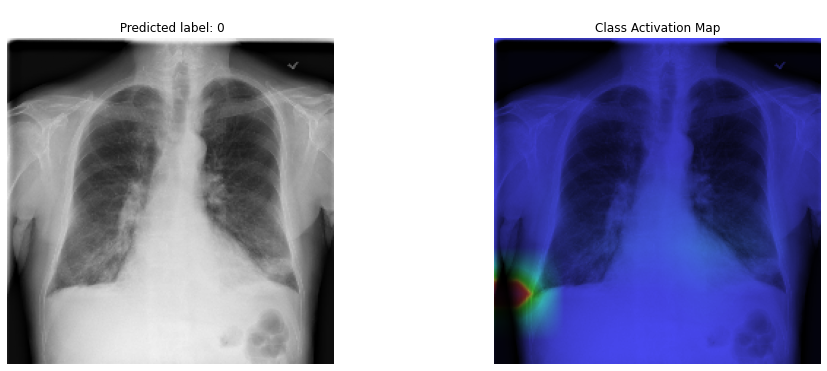

*********************************************************************************
The image 00028012_001.png
14-DIMENTIONAL Vector of Pathology values :
[3.1034780e-01 5.2256705e-03 6.2629050e-01 1.5387356e-01 5.2842256e-03
 4.3727537e-03 3.6768997e-03 2.6407601e-02 1.5716510e-01 2.2107784e-03
 9.2828721e-03 3.5276901e-04 3.8898417e-03 6.9155198e-05]
Actual pathology: Atelectasis|Cardiomegaly|Consolidation|Effusion|Pneumothorax
 
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.6262905]
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.3103478]
The Predicted Label No is 8
Predicted pathology:Consolidation
The value predicted = [0.1571651]
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.15387356]
The Predicted Label No is 7
Predicted pathology:Pneumothorax
The value predicted = [0.0264076]
 


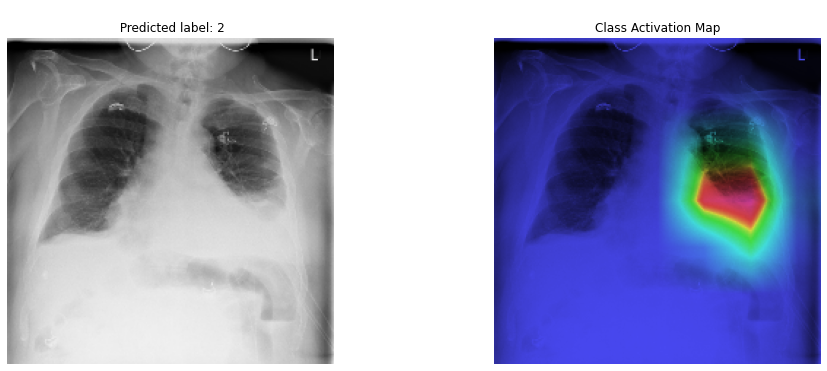

*********************************************************************************
The image 00029464_006.png
14-DIMENTIONAL Vector of Pathology values :
[2.1155262e-01 7.9273403e-04 1.2774178e-01 1.2026187e-01 3.0183755e-03
 4.5617921e-03 2.3586259e-03 1.7874025e-02 5.8736652e-02 1.2302130e-02
 4.9106432e-03 3.3897327e-04 2.5231407e-03 2.2310154e-05]
Actual pathology: Atelectasis
 
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.21155262]
 


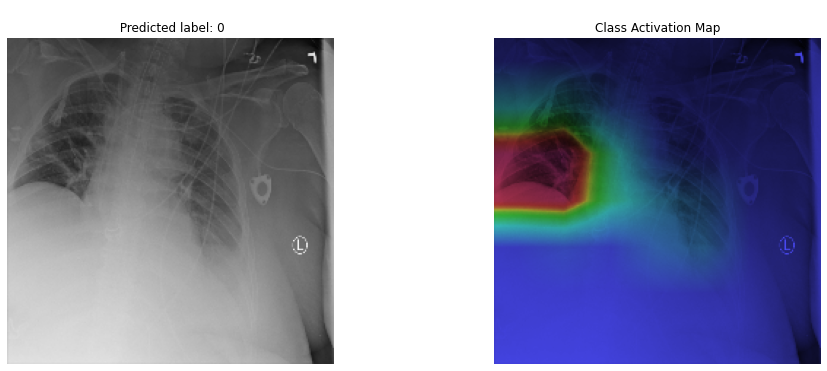

*********************************************************************************
The image 00001170_046.png
14-DIMENTIONAL Vector of Pathology values :
[1.25886813e-01 7.12546869e-04 3.31981927e-01 1.00019678e-01
 1.19939215e-01 3.01345605e-02 5.21493098e-03 1.13376006e-01
 5.29900566e-02 1.52948988e-03 1.10741397e-02 2.66813394e-02
 3.55794638e-01 5.93902878e-05]
Actual pathology: Atelectasis|Effusion|Pneumothorax
 
The Predicted Label No is 12
Predicted pathology:Pleural_Thickening
The value predicted = [0.35579464]
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.33198193]
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.12588681]
 
*********************************************************************************
The image 00016267_000.png
14-DIMENTIONAL Vector of Pathology values :
[1.01852985e-02 6.73469331e-04 5.24933357e-03 5.81353754e-02
 4.99190670e-03 7.71930069e-03 1.38308515e-03 1.76977389e-03
 7.56123010

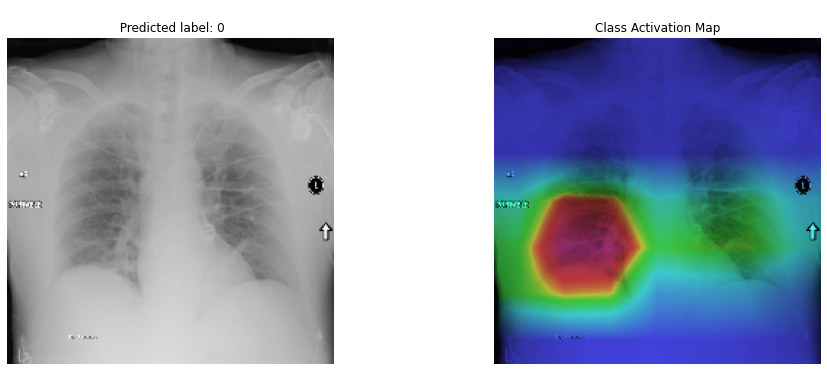

*********************************************************************************
The image 00020673_005.png
14-DIMENTIONAL Vector of Pathology values :
[1.6936463e-01 1.3729653e-02 7.9318777e-02 1.0187496e-01 1.9887753e-03
 3.7336638e-03 2.3021211e-03 1.4860004e-02 5.9415881e-02 7.2767148e-03
 5.9487536e-03 3.4353981e-04 3.3892274e-03 1.7708346e-05]
Actual pathology: Atelectasis|Infiltration
 
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.16936463]
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.10187496]
 


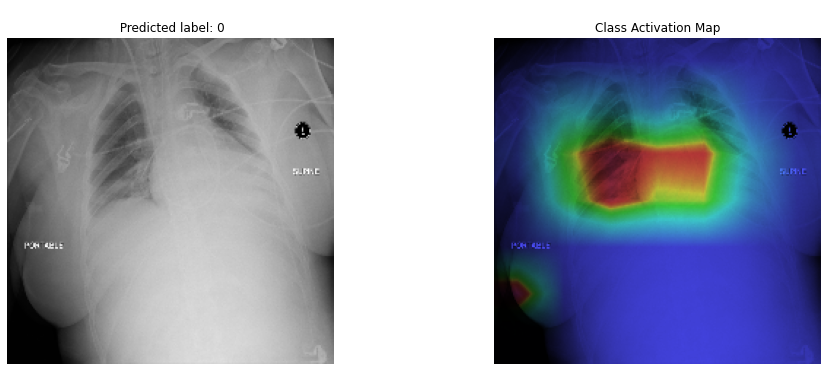

*********************************************************************************
The image 00027474_005.png
14-DIMENTIONAL Vector of Pathology values :
[2.0032401e-01 2.4552657e-03 3.9611495e-01 1.0361814e-01 8.4328260e-03
 8.3650807e-03 3.2139001e-03 5.4172259e-02 2.7741503e-02 4.6182773e-03
 1.8416015e-02 2.5443751e-03 2.1819035e-02 4.4387951e-05]
Actual pathology: Atelectasis|Effusion|Pneumothorax
 
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.39611495]
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.20032401]
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.10361814]
 


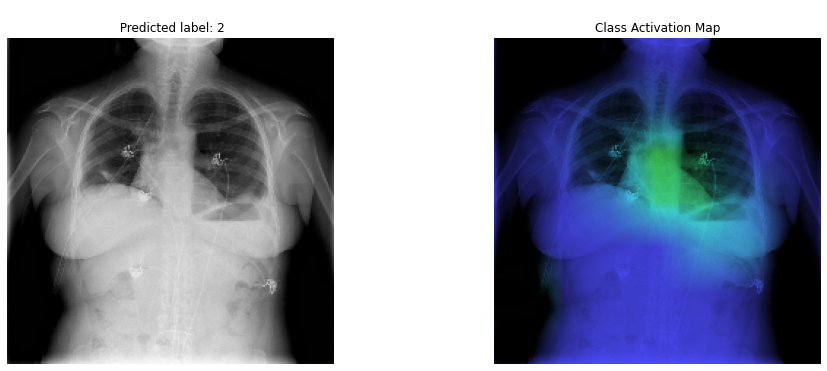

*********************************************************************************
The image 00007124_008.png
14-DIMENTIONAL Vector of Pathology values :
[2.4285360e-01 3.1147210e-03 4.8741528e-01 1.5100460e-01 1.5895797e-02
 2.0788914e-02 5.3965682e-03 4.7853272e-02 9.4359629e-02 2.1831330e-03
 6.1978051e-03 1.3317848e-03 2.7499152e-02 3.1433163e-05]
Actual pathology: Atelectasis|Effusion|Infiltration
 
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.48741528]
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.2428536]
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.1510046]
 


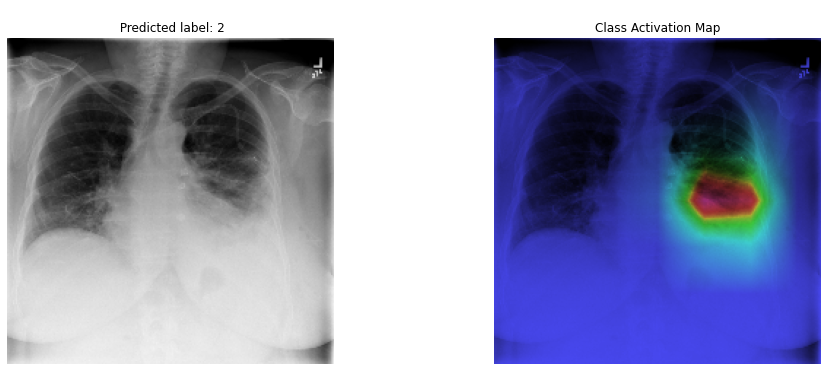

*********************************************************************************
The image 00027866_002.png
14-DIMENTIONAL Vector of Pathology values :
[3.2087451e-01 1.5148780e-02 1.4891717e-01 1.9356556e-01 5.6624855e-03
 6.5041776e-03 8.4321322e-03 7.4461871e-03 6.1641216e-02 5.6074254e-02
 3.2041913e-03 4.7579579e-04 4.8573576e-03 2.2219192e-05]
Actual pathology: Atelectasis|Effusion|Infiltration
 
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.3208745]
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.19356556]
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.14891717]
 


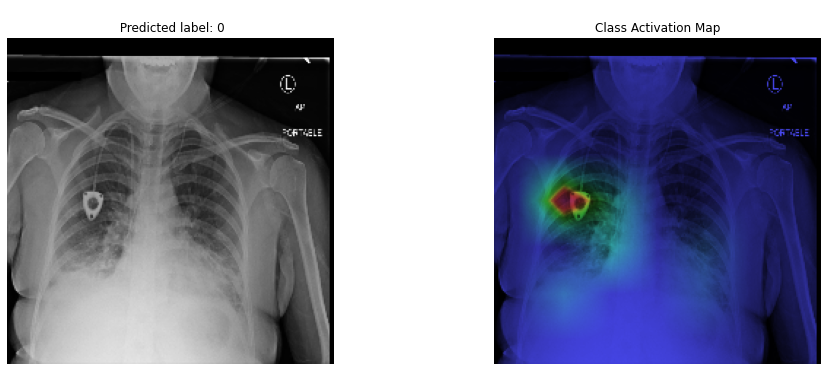

*********************************************************************************
The image 00000149_006.png
14-DIMENTIONAL Vector of Pathology values :
[2.2542377e-01 1.0320491e-03 6.1360467e-02 7.4170262e-02 4.5236689e-03
 6.6171451e-03 2.1401749e-03 1.1586064e-01 3.7667342e-02 2.8504177e-03
 1.7834516e-02 2.5657718e-03 1.2086890e-02 1.5207042e-04]
Actual pathology: Atelectasis
 
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.22542377]
 


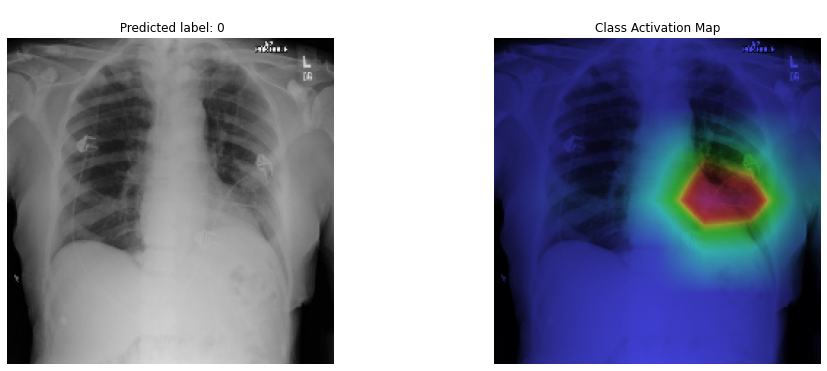

*********************************************************************************
The image 00030434_000.png
14-DIMENTIONAL Vector of Pathology values :
[2.9686447e-02 3.8403543e-03 1.5810963e-02 4.8662297e-02 5.4224334e-03
 1.2736635e-02 9.9098647e-04 2.3580585e-02 1.0485108e-02 1.5813780e-03
 8.3646141e-03 8.8495651e-04 3.5794047e-03 4.9114198e-05]
Actual pathology: Atelectasis
 
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.0486623]
 
*********************************************************************************
The image 00019271_030.png
14-DIMENTIONAL Vector of Pathology values :
[3.8424876e-01 9.1468688e-04 2.6503235e-02 1.8613747e-01 4.1306559e-03
 1.6751816e-02 7.6574711e-03 1.2870750e-02 3.8054295e-02 1.6443225e-02
 9.6804192e-03 7.0132979e-04 1.1546457e-03 1.0662695e-04]
Actual pathology: Atelectasis
 
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.38424876]
 


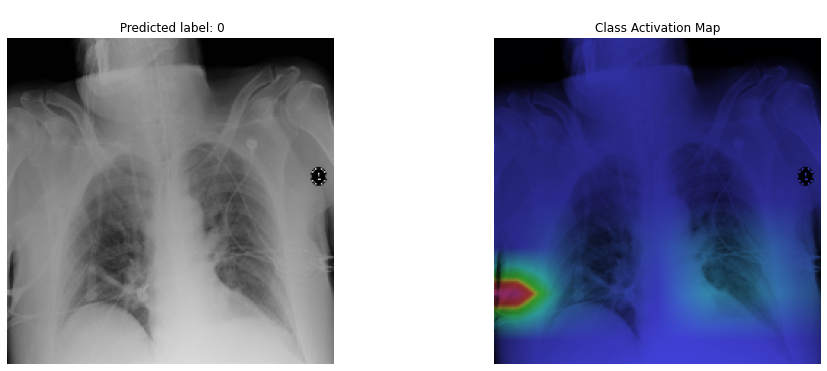

*********************************************************************************
The image 00020408_037.png
14-DIMENTIONAL Vector of Pathology values :
[1.73875555e-01 3.30865267e-03 1.97305590e-01 2.66010880e-01
 4.72719315e-03 5.27309114e-03 6.07055007e-03 5.89348748e-03
 1.60846010e-01 1.28638623e-02 1.19049605e-02 3.29335046e-04
 2.56964448e-03 9.94464881e-06]
Actual pathology: Atelectasis|Effusion
 
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.26601088]
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.19730559]
 
*********************************************************************************
The image 00023176_010.png
14-DIMENTIONAL Vector of Pathology values :
[1.59484267e-01 3.32208071e-03 1.19036220e-01 1.27600476e-01
 6.55237539e-03 7.96596985e-03 2.95732636e-03 1.60880923e-01
 4.32612449e-02 8.54312722e-03 1.02705024e-01 1.34737324e-03
 1.60172991e-02 7.39408060e-05]
Actual pathology: Atelectasis|Emp

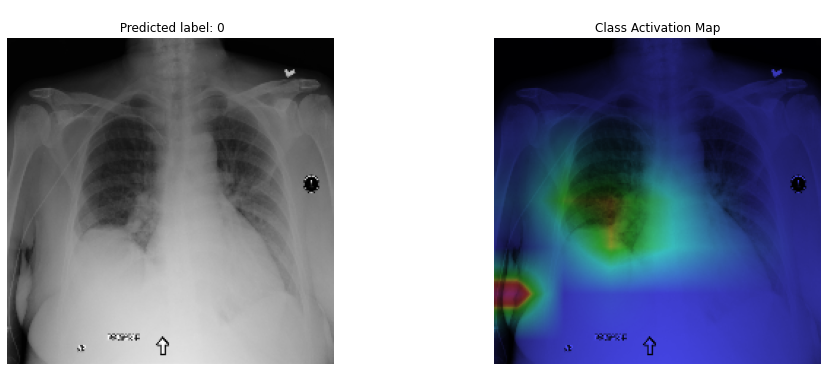

*********************************************************************************
The image 00025228_005.png
14-DIMENTIONAL Vector of Pathology values :
[3.1620285e-01 7.8604724e-03 7.2334582e-01 2.4704202e-01 1.1820119e-02
 1.1063711e-02 9.7420691e-03 7.7534788e-03 2.2582924e-01 4.0806914e-03
 3.5409250e-03 1.1048414e-03 1.1623732e-02 1.3816473e-04]
Actual pathology: Atelectasis|Effusion
 
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.7233458]
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.31620285]
 


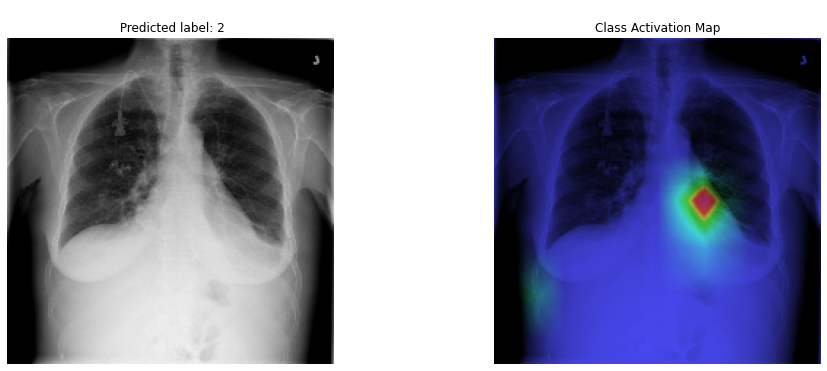

*********************************************************************************
The image 00021796_000.png
14-DIMENTIONAL Vector of Pathology values :
[1.03865363e-01 1.14656836e-02 3.75028431e-01 1.07508942e-01
 7.83806592e-02 3.56549956e-02 6.08383305e-03 4.98534143e-02
 5.18782213e-02 2.41631409e-03 8.23200494e-03 1.21523840e-02
 1.99675232e-01 1.16279705e-04]
Actual pathology: Effusion|Atelectasis
 
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.37502843]
The Predicted Label No is 12
Predicted pathology:Pleural_Thickening
The value predicted = [0.19967523]
 


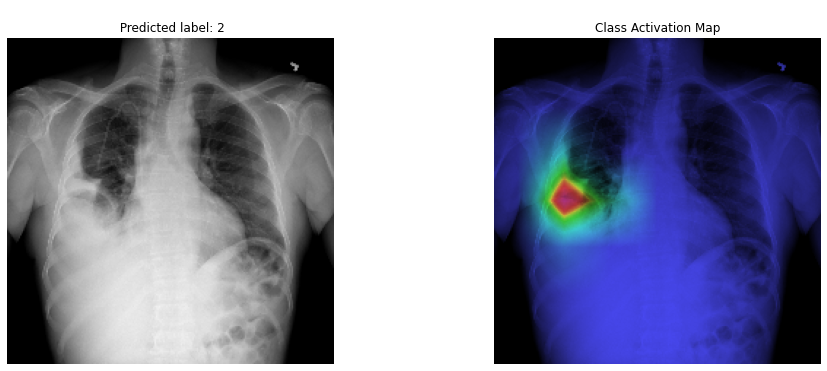

*********************************************************************************
The image 00008005_004.png
14-DIMENTIONAL Vector of Pathology values :
[0.06597206 0.00307871 0.01512898 0.08163949 0.00183154 0.00579917
 0.00215387 0.06783113 0.0209098  0.01184185 0.01110849 0.00058935
 0.00295181 0.00031217]
Actual pathology: Atelectasis|Infiltration
 
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.08163949]
The Predicted Label No is 7
Predicted pathology:Pneumothorax
The value predicted = [0.06783113]
 


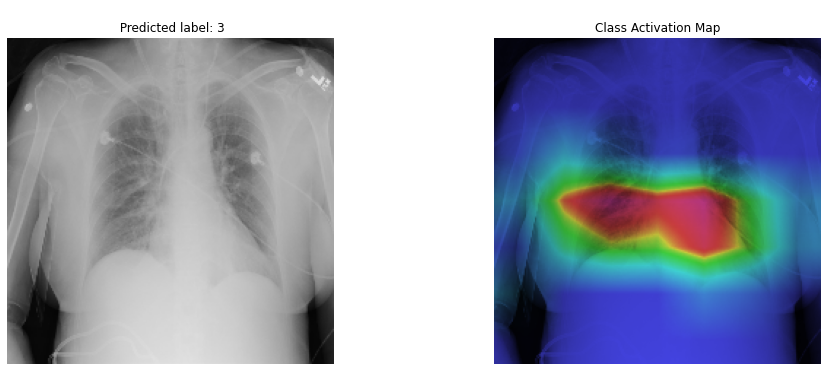

*********************************************************************************
The image 00021495_005.png
14-DIMENTIONAL Vector of Pathology values :
[2.3848772e-01 3.9008381e-03 2.5897169e-01 1.8116358e-01 1.4404368e-02
 1.4922708e-02 5.5307727e-03 6.6151261e-02 7.3099740e-02 2.2338586e-02
 3.4509307e-01 1.2987433e-03 9.1287643e-03 1.7025837e-05]
Actual pathology: Atelectasis|Consolidation|Effusion|Emphysema|Nodule|Pneumothorax
 
The Predicted Label No is 10
Predicted pathology:Emphysema
The value predicted = [0.34509307]
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.2589717]
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.23848772]
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.18116358]
The Predicted Label No is 8
Predicted pathology:Consolidation
The value predicted = [0.07309974]
The Predicted Label No is 7
Predicted pathology:Pneumothorax
The value predicted = [0.066

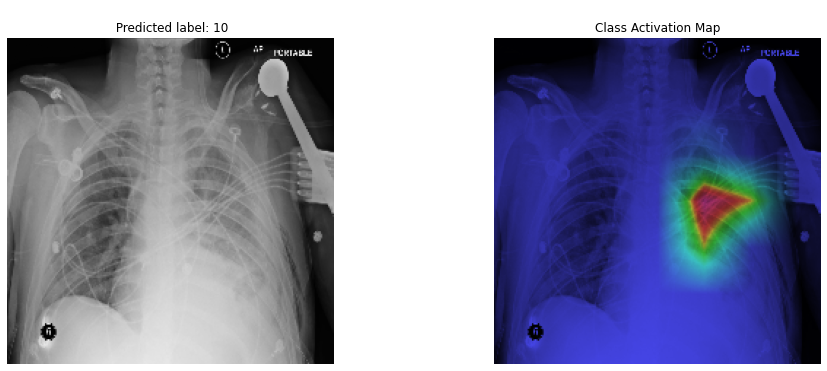

*********************************************************************************
The image 00018496_006.png
14-DIMENTIONAL Vector of Pathology values :
[2.2496274e-01 2.0888408e-03 6.2764090e-01 8.7741405e-02 3.1518508e-02
 2.4904298e-02 4.1350261e-03 4.5509670e-02 5.1572971e-02 1.3840140e-03
 1.5161698e-02 2.3842610e-03 2.5140323e-02 1.9894759e-04]
Actual pathology: Atelectasis|Effusion|Pneumothorax
 
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.6276409]
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.22496274]
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.0877414]
 


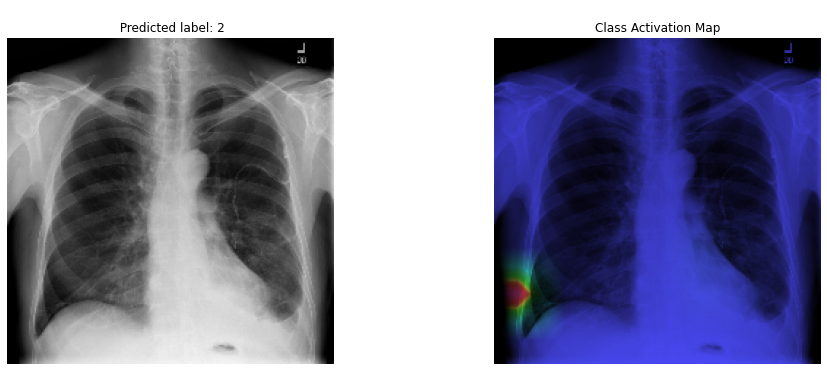

*********************************************************************************
The image 00029088_023.png
14-DIMENTIONAL Vector of Pathology values :
[2.1442632e-01 5.2899221e-04 5.6691360e-02 1.2589717e-01 9.8171656e-04
 1.7080155e-03 1.2500214e-03 9.4298291e-04 5.7040166e-02 6.1405418e-03
 4.5114928e-03 4.2570344e-05 7.3649170e-04 2.4209969e-06]
Actual pathology: Atelectasis|Consolidation|Infiltration
 
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.21442632]
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.12589717]
The Predicted Label No is 8
Predicted pathology:Consolidation
The value predicted = [0.05704017]
 


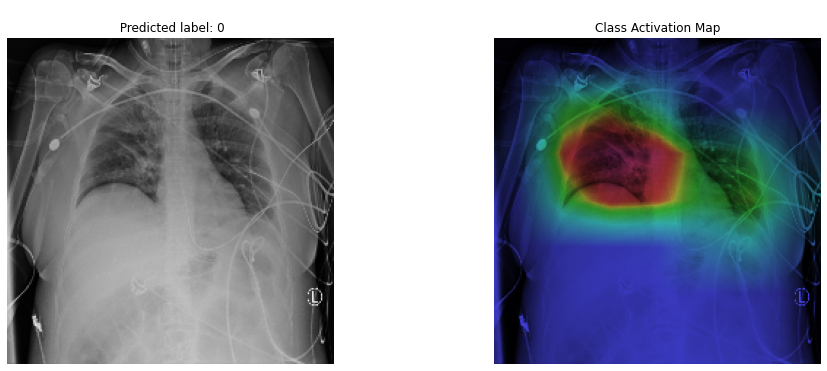

*********************************************************************************
The image 00014607_007.png
14-DIMENTIONAL Vector of Pathology values :
[0.2737655  0.00366076 0.13681418 0.20796138 0.00503972 0.00839925
 0.00899579 0.04788631 0.04980275 0.02528705 0.02135355 0.00057439
 0.00186227 0.00035596]
Actual pathology: Atelectasis|Infiltration
 
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.2737655]
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.20796138]
 


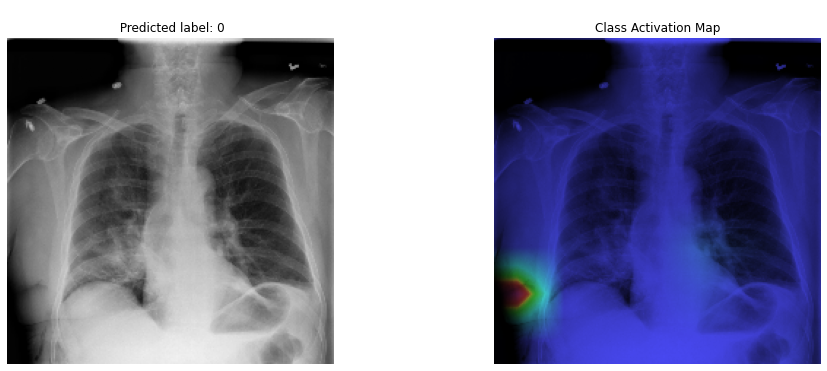

*********************************************************************************
The image 00004968_004.png
14-DIMENTIONAL Vector of Pathology values :
[0.1644905  0.01105162 0.19148965 0.08560886 0.03510704 0.01147991
 0.00395061 0.02189747 0.03165426 0.00704692 0.0276302  0.00441923
 0.0252067  0.00071023]
Actual pathology: Atelectasis|Effusion|Infiltration
 
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.19148965]
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.1644905]
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.08560886]
 


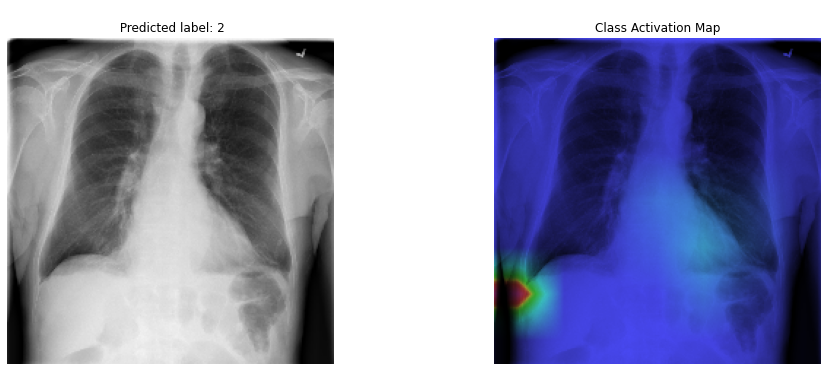

*********************************************************************************
The image 00019271_064.png
14-DIMENTIONAL Vector of Pathology values :
[3.5138306e-01 1.8307563e-03 5.3345051e-02 5.6017846e-02 1.3162355e-03
 1.9332533e-03 1.0246285e-03 1.3176308e-02 2.2812637e-02 2.7657580e-03
 9.5671499e-03 5.1474292e-04 5.1137391e-03 1.4826402e-05]
Actual pathology: Atelectasis
 
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.35138306]
 


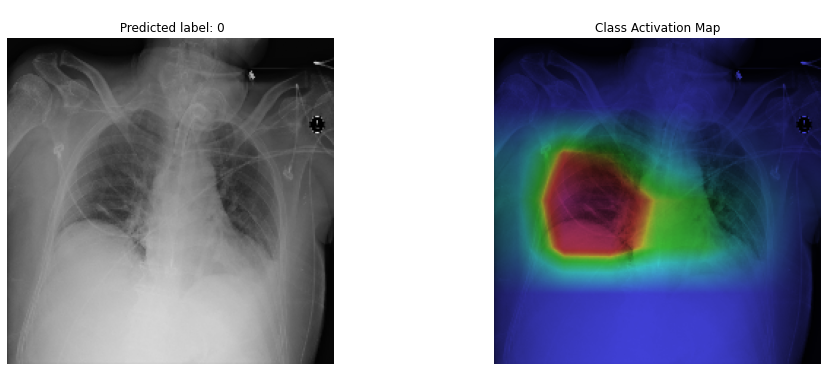

*********************************************************************************
The image 00010936_011.png
14-DIMENTIONAL Vector of Pathology values :
[1.5174334e-02 9.0227863e-03 1.3906276e-02 5.1087741e-02 4.5558396e-03
 6.0277716e-03 2.0589414e-03 1.1853685e-02 9.6669476e-03 2.1835919e-03
 2.5706578e-03 9.0879871e-04 2.4642691e-03 1.5201314e-06]
Actual pathology: Atelectasis
 
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.05108774]
 
*********************************************************************************
The image 00000211_010.png
14-DIMENTIONAL Vector of Pathology values :
[9.7501867e-02 5.7373029e-01 3.9092901e-01 1.7593524e-01 1.5307259e-02
 1.2553730e-02 7.1803718e-03 1.6002679e-02 3.4895401e-02 1.9346636e-02
 1.2583260e-02 4.2353566e-03 3.8382728e-02 5.6228946e-06]
Actual pathology: Atelectasis|Cardiomegaly|Effusion|Infiltration
 
The Predicted Label No is 1
Predicted pathology:Cardiomegaly
The value predicted = [0.5737303]
Th

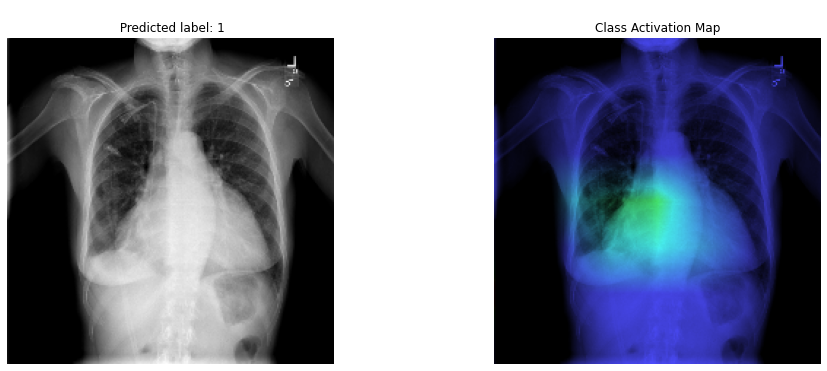

*********************************************************************************
The image 00017255_001.png
14-DIMENTIONAL Vector of Pathology values :
[1.2835659e-02 4.6826489e-04 4.8428304e-03 3.4710929e-02 1.9651225e-03
 6.3275760e-03 9.8249083e-04 9.3303761e-03 6.7045875e-03 1.0140588e-03
 1.9510095e-03 7.7779056e-04 3.1982120e-03 6.0741745e-06]
Actual pathology: Atelectasis|Pneumonia
 
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.03471093]
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.01283566]
 
*********************************************************************************
The image 00007676_002.png
14-DIMENTIONAL Vector of Pathology values :
[0.08944315 0.00039834 0.01682776 0.07933877 0.01942299 0.01527153
 0.0031941  0.21181458 0.03269395 0.00592151 0.03908852 0.00210834
 0.00868672 0.00067542]
Actual pathology: Atelectasis|Pneumothorax
 
The Predicted Label No is 7
Predicted pathology:Pneumoth

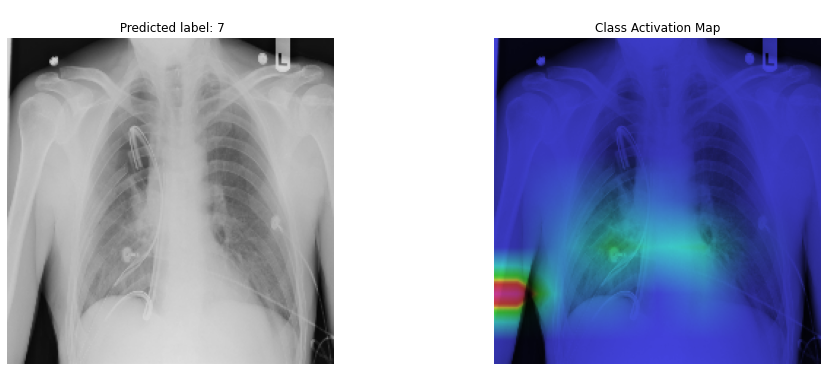

*********************************************************************************
The image 00005089_002.png
14-DIMENTIONAL Vector of Pathology values :
[1.6686474e-01 1.1779625e-02 2.5091949e-01 1.3910450e-01 5.2038529e-03
 9.3053076e-03 3.0260419e-03 5.6711745e-02 9.6522160e-02 6.1459020e-03
 7.2814864e-03 4.8339984e-04 4.9581053e-03 2.2066246e-05]
Actual pathology: Atelectasis
 
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.2509195]
 
*********************************************************************************
The image 00020857_008.png
14-DIMENTIONAL Vector of Pathology values :
[3.1548458e-01 1.4218782e-03 1.4226751e-02 1.3123839e-01 4.2560655e-03
 4.3518650e-03 6.8197935e-03 2.6442576e-02 4.5477990e-02 1.1207849e-02
 5.7062944e-03 7.3680375e-04 1.1767974e-03 4.0501734e-05]
Actual pathology: Emphysema|Infiltration|Atelectasis
 
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.31548458]
The Predicted Label

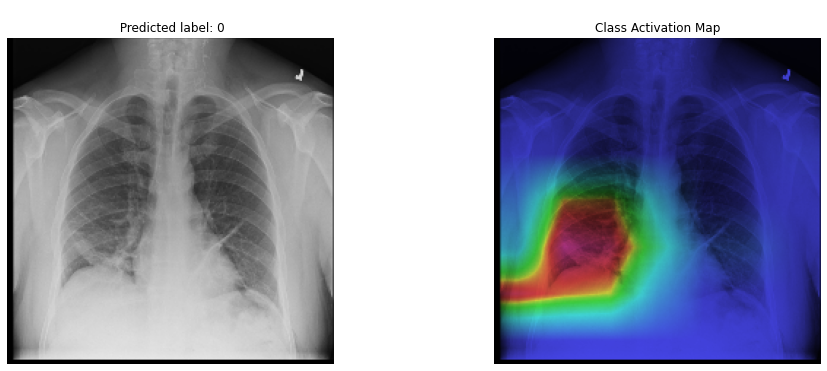

*********************************************************************************
The image 00012291_008.png
14-DIMENTIONAL Vector of Pathology values :
[3.1053963e-01 5.9513794e-03 2.3749849e-01 7.6851919e-02 1.5156929e-02
 4.3648514e-03 3.0292100e-03 5.4011267e-02 4.7243487e-02 3.2072423e-03
 2.1532189e-02 2.2134674e-03 1.8483534e-02 6.1825398e-05]
Actual pathology: Atelectasis
 
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.31053963]
 


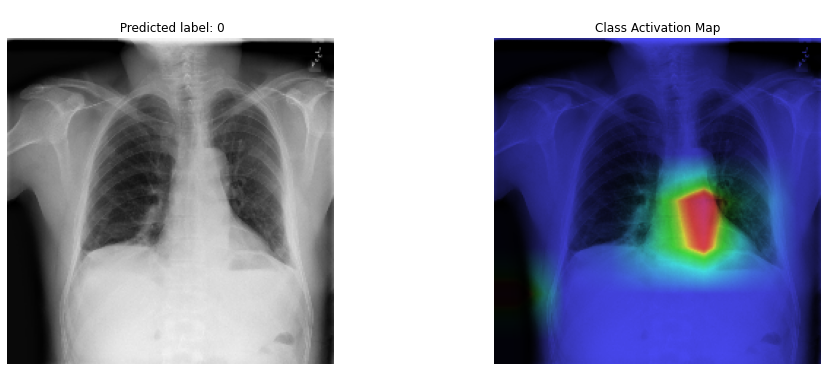

*********************************************************************************
The image 00018762_002.png
14-DIMENTIONAL Vector of Pathology values :
[2.4373330e-01 1.6523372e-02 1.4347003e-01 9.9303141e-02 6.7874850e-03
 8.8392096e-03 6.2618651e-03 8.2452662e-02 7.6538764e-02 8.4940344e-04
 1.2654436e-02 6.7895879e-03 2.8354639e-02 4.6603549e-05]
Actual pathology: Atelectasis
 
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.2437333]
 


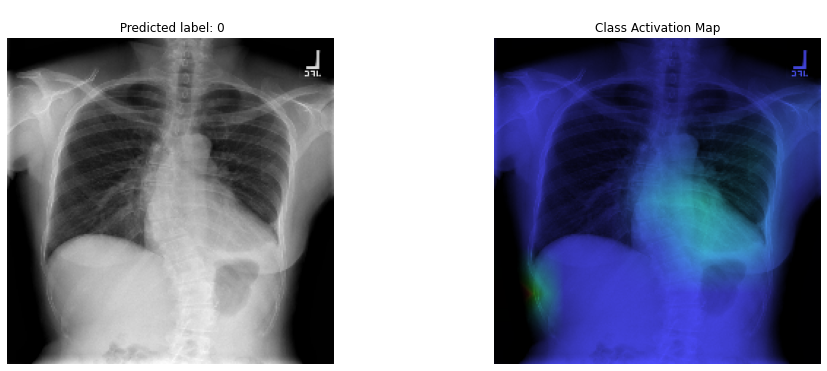

*********************************************************************************
The image 00000468_017.png
14-DIMENTIONAL Vector of Pathology values :
[8.5639492e-02 1.4132545e-03 1.8570339e-02 1.2760359e-01 7.5413971e-03
 1.4831837e-02 4.7536814e-03 1.4243768e-01 2.0118762e-02 1.8051911e-02
 4.0265586e-02 1.0494711e-03 7.1107592e-03 6.1837192e-05]
Actual pathology: Atelectasis|Pneumothorax
 
The Predicted Label No is 7
Predicted pathology:Pneumothorax
The value predicted = [0.14243768]
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.12760359]
 


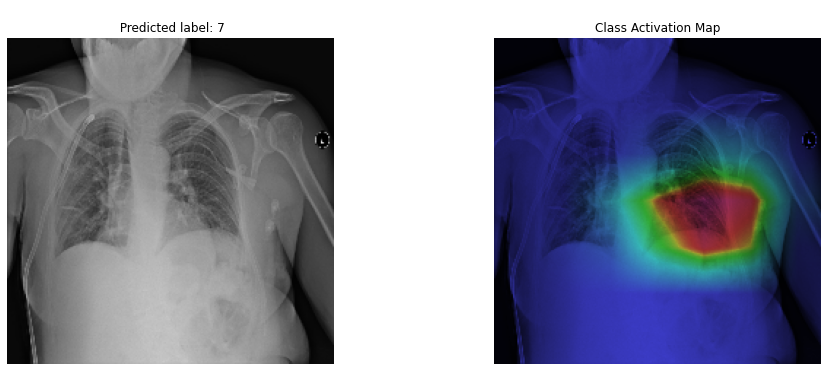

*********************************************************************************
The image 00014253_042.png
14-DIMENTIONAL Vector of Pathology values :
[2.25504100e-01 3.51018552e-03 7.15013146e-01 1.43042088e-01
 9.57227871e-03 5.11814374e-03 2.72693345e-03 2.72362866e-02
 1.04119256e-01 2.93508880e-02 3.64094153e-02 5.75513870e-04
 5.35030803e-03 2.79814940e-05]
Actual pathology: Atelectasis|Effusion
 
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.71501315]
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.2255041]
 


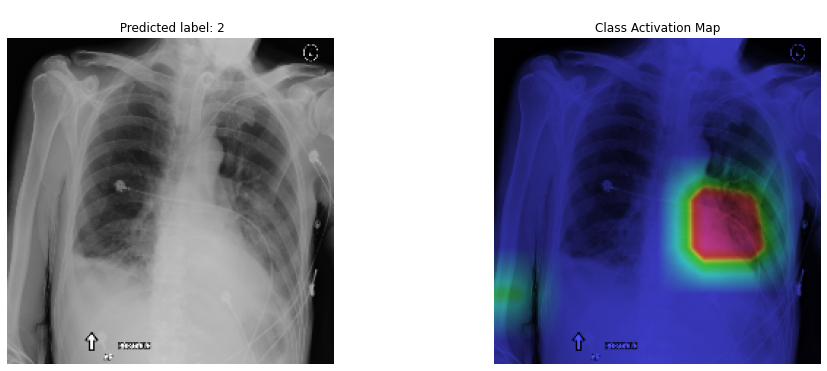

*********************************************************************************
The image 00026136_002.png
14-DIMENTIONAL Vector of Pathology values :
[3.9260003e-01 5.4700188e-03 3.3732533e-01 1.4996296e-01 3.1184189e-03
 4.3498822e-03 5.7402095e-03 1.9259633e-02 9.8624513e-02 8.8904016e-03
 5.4760147e-03 1.0970603e-03 5.9444155e-03 1.3612834e-04]
Actual pathology: Atelectasis
 
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.39260003]
 


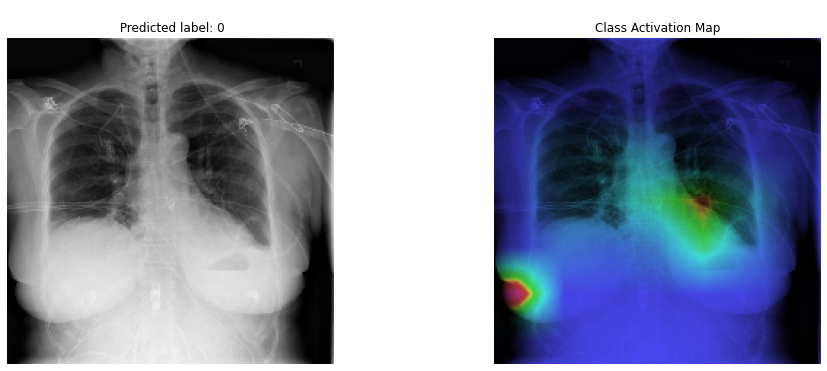

*********************************************************************************
The image 00013685_000.png
14-DIMENTIONAL Vector of Pathology values :
[6.16974294e-01 7.22715398e-03 2.58662641e-01 1.09868214e-01
 6.05612108e-03 5.29374043e-03 5.56367449e-03 2.23545097e-02
 6.02217279e-02 3.64141003e-03 1.02661019e-02 1.85234507e-03
 1.18489945e-02 9.88761822e-05]
Actual pathology: Atelectasis|Effusion
 
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.6169743]
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.25866264]
 


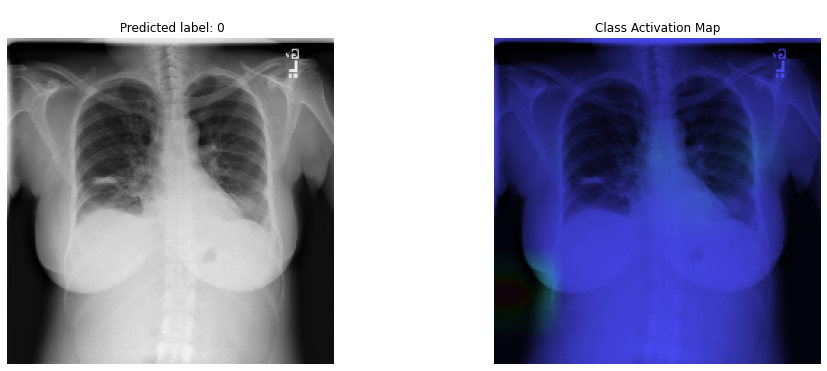

*********************************************************************************
The image 00003787_003.png
14-DIMENTIONAL Vector of Pathology values :
[4.7453523e-01 2.0709962e-03 5.6837909e-02 1.1666311e-01 6.1256806e-03
 6.4558298e-03 3.7407726e-03 8.5843854e-02 2.7722836e-02 1.8855860e-03
 3.7779197e-02 3.0850647e-03 1.1471041e-02 1.1334458e-04]
Actual pathology: Atelectasis|Pneumothorax
 
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.47453523]
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.11666311]
 


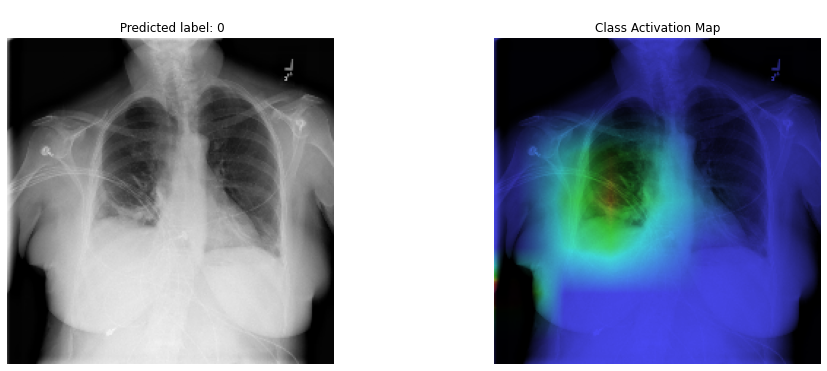

*********************************************************************************
The image 00030106_008.png
14-DIMENTIONAL Vector of Pathology values :
[1.9863804e-01 1.1859349e-02 4.0278423e-01 8.7090701e-02 3.0794721e-02
 1.0297303e-02 1.7305078e-03 3.0349234e-02 9.8609291e-02 2.9260642e-03
 1.0504345e-02 1.0427481e-03 2.7821155e-02 8.2120016e-05]
Actual pathology: Atelectasis|Effusion
 
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.40278423]
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.19863804]
 


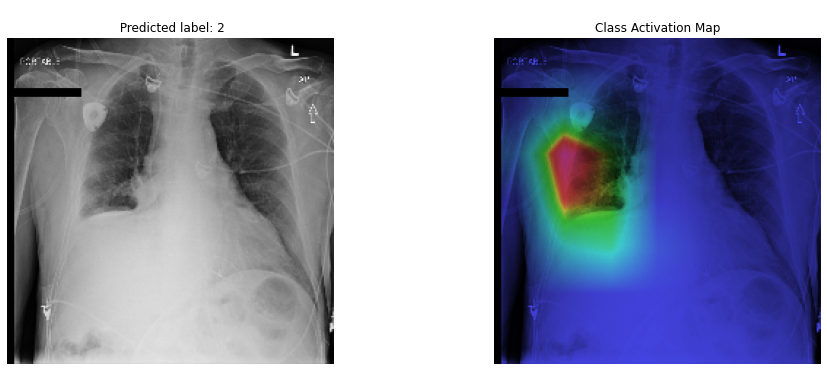

*********************************************************************************
The image 00030260_005.png
14-DIMENTIONAL Vector of Pathology values :
[8.8937946e-02 1.1771303e-03 5.6402490e-02 5.3046852e-02 1.5121112e-02
 1.0353573e-02 1.3390955e-03 1.9735855e-01 1.7302033e-02 7.8708176e-03
 4.5538989e-01 1.9546582e-03 9.7441580e-03 6.3324776e-05]
Actual pathology: Atelectasis|Pneumothorax
 
The Predicted Label No is 10
Predicted pathology:Emphysema
The value predicted = [0.4553899]
The Predicted Label No is 7
Predicted pathology:Pneumothorax
The value predicted = [0.19735855]
 
*********************************************************************************
The image 00015262_005.png
14-DIMENTIONAL Vector of Pathology values :
[5.5048150e-01 1.2916445e-03 1.7597799e-01 1.1568492e-01 2.0613177e-03
 1.9217639e-03 2.6442821e-03 1.6967913e-02 8.4538393e-02 9.5037585e-03
 1.8625645e-02 3.4845804e-04 1.4373433e-03 1.7084378e-04]
Actual pathology: Atelectasis|Effusion
 
The Predicted Lab

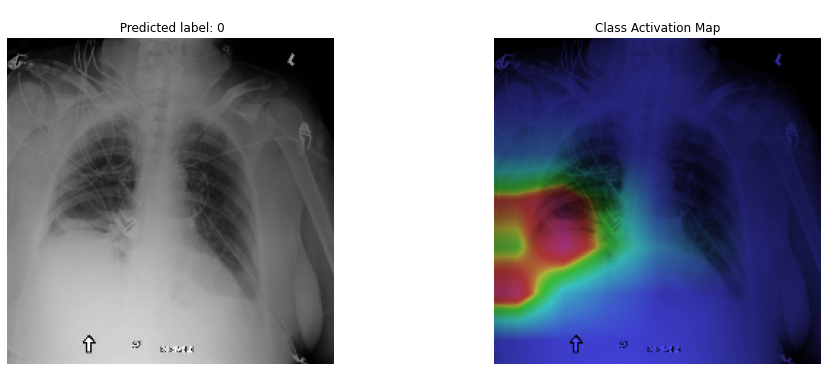

*********************************************************************************
The image 00010625_014.png
14-DIMENTIONAL Vector of Pathology values :
[4.64743644e-01 5.79582863e-02 8.62359256e-02 2.86992520e-01
 2.88871489e-02 8.04821029e-03 1.52666615e-02 2.68036705e-02
 2.37417951e-01 5.63385943e-03 6.35952875e-03 1.61668472e-03
 8.29993095e-03 3.57324374e-04]
Actual pathology: Atelectasis|Cardiomegaly
 
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.46474364]
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.28699252]
 


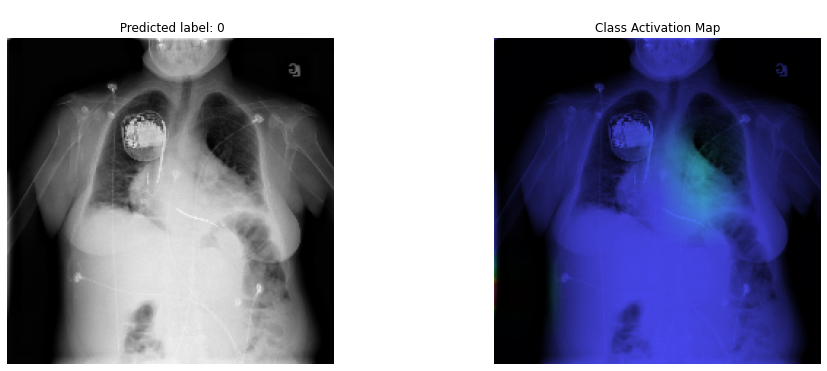

*********************************************************************************
The image 00006851_034.png
14-DIMENTIONAL Vector of Pathology values :
[1.1324358e-01 4.5382677e-04 2.4807028e-01 6.1976269e-02 9.3200151e-03
 1.3090472e-02 1.8609414e-03 3.3953600e-02 2.1460960e-02 3.5663890e-03
 1.4121018e-02 5.2974178e-03 4.9716908e-02 3.4316727e-05]
Actual pathology: Atelectasis
 
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.24807028]
 
*********************************************************************************
The image 00019495_004.png
14-DIMENTIONAL Vector of Pathology values :
[0.15249918 0.00574649 0.0114283  0.07193108 0.00213752 0.00617939
 0.0042388  0.01042369 0.02450493 0.00255389 0.00882499 0.00409967
 0.00714701 0.00017378]
Actual pathology: Atelectasis|Fibrosis
 
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.15249918]
The Predicted Label No is 3
Predicted pathology:Infiltration
The value pre

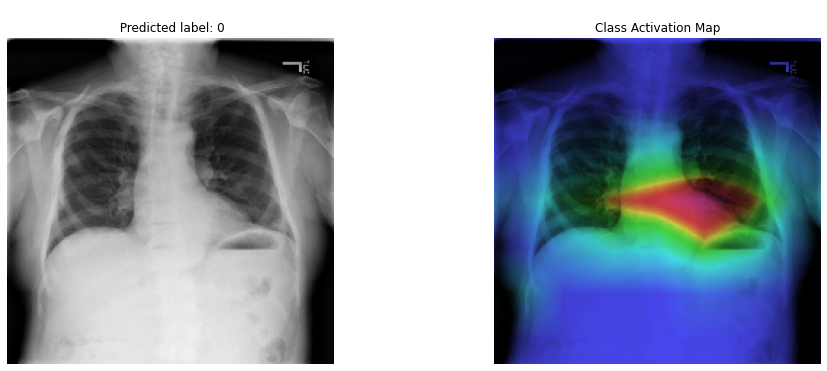

*********************************************************************************
The image 00019089_004.png
14-DIMENTIONAL Vector of Pathology values :
[1.1201488e-01 7.6240492e-03 2.6673996e-01 1.2764212e-01 1.2720731e-01
 1.8434238e-02 2.2797186e-03 1.3617645e-02 5.7849500e-02 1.2392203e-02
 6.6469698e-03 7.7848131e-04 2.1233970e-02 9.1138154e-06]
Actual pathology: Atelectasis|Effusion|Mass
 
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.26673996]
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.12764212]
The Predicted Label No is 4
Predicted pathology:Mass
The value predicted = [0.12720731]
 


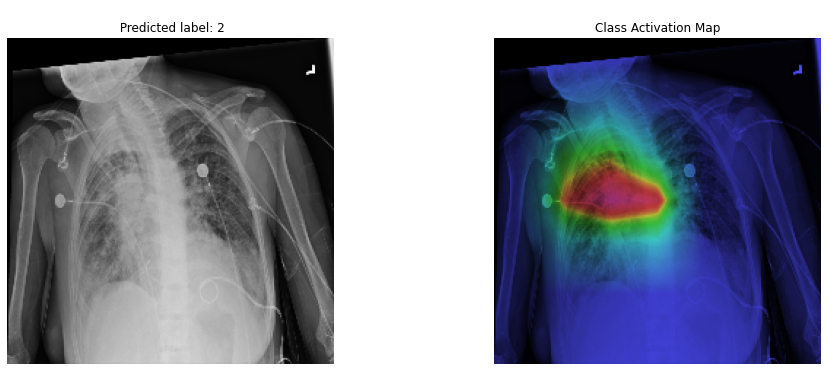

*********************************************************************************
The image 00017151_003.png
14-DIMENTIONAL Vector of Pathology values :
[4.4072399e-01 4.6021482e-03 6.8694824e-01 1.7691912e-01 8.7791625e-03
 4.9745385e-03 4.9413061e-03 4.3450773e-02 1.8754353e-01 1.1869774e-03
 8.0449907e-03 3.2533254e-04 3.2964617e-03 1.9570137e-04]
Actual pathology: Atelectasis|Effusion
 
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.68694824]
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.440724]
 


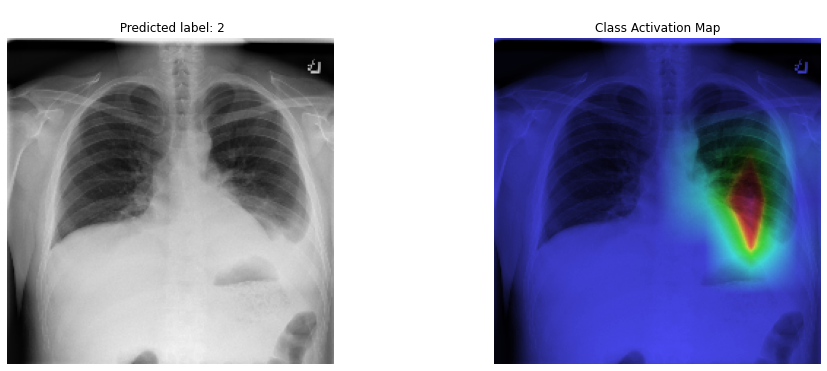

*********************************************************************************
The image 00020349_006.png
14-DIMENTIONAL Vector of Pathology values :
[1.23212665e-01 2.89278664e-03 2.46335313e-01 1.20454006e-01
 4.34075575e-03 4.69528232e-03 2.84228264e-03 2.15237308e-02
 1.31480813e-01 1.28493505e-02 1.58462767e-02 3.02533794e-04
 2.99066119e-03 2.41558118e-05]
Actual pathology: Atelectasis|Consolidation
 
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.24633531]
The Predicted Label No is 8
Predicted pathology:Consolidation
The value predicted = [0.13148081]
 
*********************************************************************************
The image 00006851_033.png
14-DIMENTIONAL Vector of Pathology values :
[1.9157565e-01 9.2375732e-04 2.6613113e-01 9.2787556e-02 2.5400380e-03
 3.9563901e-03 1.8582322e-03 8.2560077e-02 6.2835366e-02 8.9796940e-03
 7.0526968e-03 7.7716267e-04 8.9979675e-03 1.9044079e-05]
Actual pathology: Atelectasis
 
The Predic

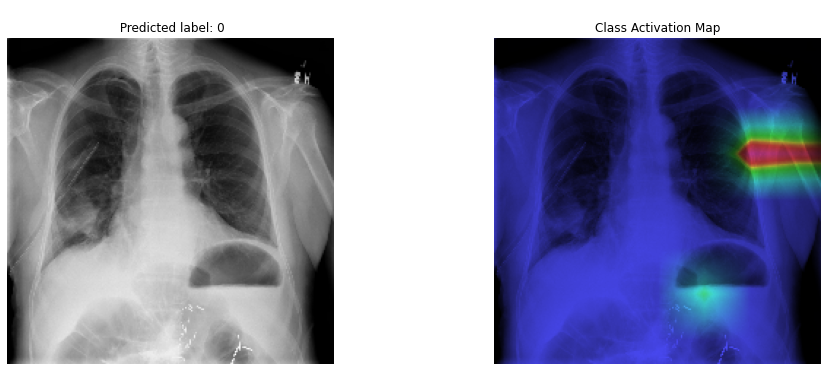

*********************************************************************************
The image 00013685_028.png
14-DIMENTIONAL Vector of Pathology values :
[1.2220540e-01 1.2448730e-03 2.8550288e-01 1.5205239e-01 1.2601978e-02
 9.4581237e-03 2.5777367e-03 8.2383174e-03 7.1055785e-02 2.5864145e-02
 8.6032124e-03 2.3232836e-04 3.3272456e-03 9.6177700e-06]
Actual pathology: Atelectasis|Effusion|Infiltration
 
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.28550288]
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.15205239]
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.1222054]
 


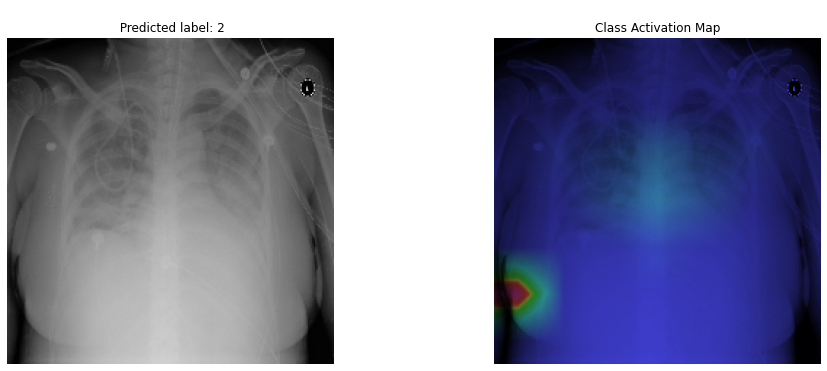

*********************************************************************************
The image 00010481_021.png
14-DIMENTIONAL Vector of Pathology values :
[8.8862784e-02 3.8749221e-04 1.8676477e-03 2.5672125e-02 2.5859098e-03
 3.4948359e-03 6.5256428e-04 1.7067199e-03 5.0670225e-03 7.7010709e-04
 4.8512526e-04 2.4314149e-04 9.2693180e-04 1.1370470e-05]
Actual pathology: Atelectasis
 
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.08886278]
 


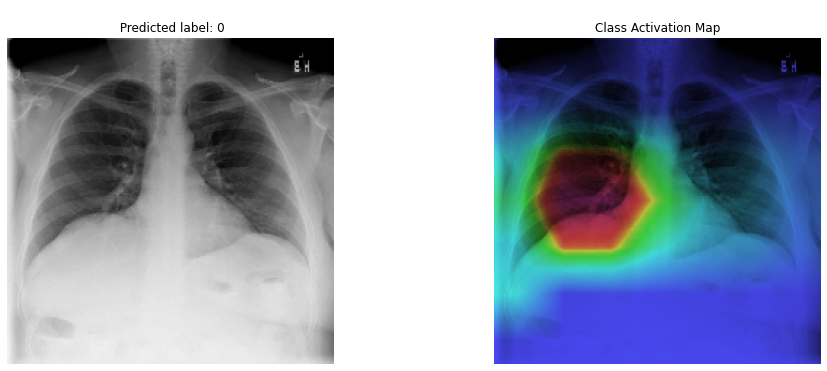

*********************************************************************************
The image 00026886_004.png
14-DIMENTIONAL Vector of Pathology values :
[1.61743924e-01 3.49003822e-03 2.09291339e-01 1.67844534e-01
 1.54033350e-02 1.94342323e-02 6.66367402e-03 1.06583476e-01
 5.36964759e-02 4.66947537e-03 2.70312820e-02 1.08872820e-02
 7.71948695e-02 2.91612869e-05]
Actual pathology: Atelectasis|Infiltration|Pneumothorax
 
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.20929134]
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.16784453]
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.16174392]
 
*********************************************************************************
The image 00016403_003.png
14-DIMENTIONAL Vector of Pathology values :
[2.2273798e-01 2.3966213e-03 1.3937230e-01 1.2728411e-01 3.2250492e-03
 5.1113740e-03 6.1482033e-03 6.4900644e-02 6.7331493e-02 2.373647

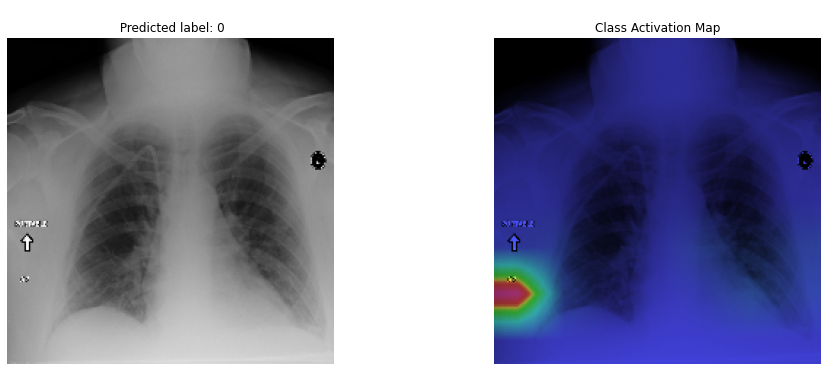

*********************************************************************************
The image 00010575_002.png
14-DIMENTIONAL Vector of Pathology values :
[0.28060383 0.00202066 0.5312905  0.10096466 0.02843091 0.01553824
 0.00392349 0.03193768 0.03438979 0.00240968 0.02173908 0.00278868
 0.03306595 0.00087413]
Actual pathology: Atelectasis|Effusion|Infiltration
 
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.5312905]
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.28060383]
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.10096466]
 


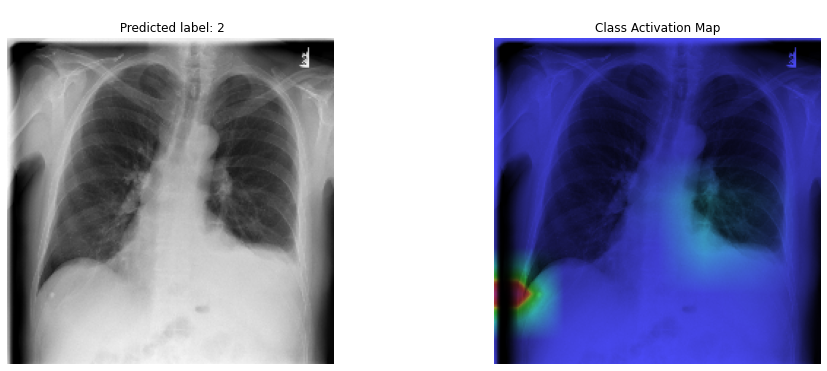

*********************************************************************************
The image 00011857_001.png
14-DIMENTIONAL Vector of Pathology values :
[3.92984360e-01 1.09352227e-02 2.91124403e-01 1.89736888e-01
 1.64778400e-02 7.97515828e-03 1.19437147e-02 1.04966806e-02
 8.12623352e-02 1.10391378e-02 1.07202185e-02 1.05011475e-03
 9.83197708e-03 4.77172216e-05]
Actual pathology: Atelectasis|Consolidation|Effusion|Infiltration
 
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.39298436]
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.2911244]
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.18973689]
The Predicted Label No is 8
Predicted pathology:Consolidation
The value predicted = [0.08126234]
 


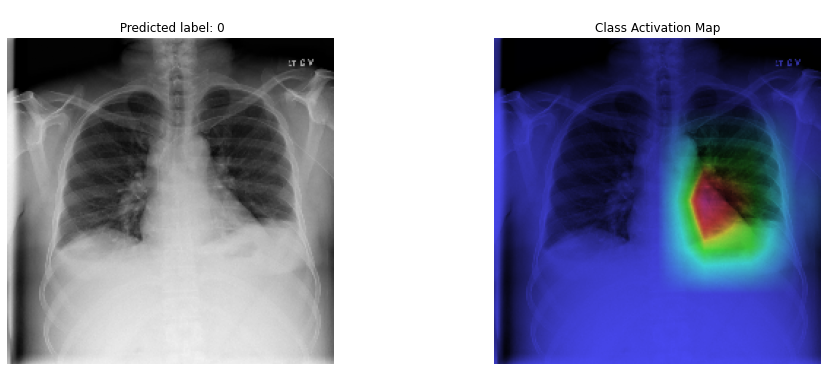

*********************************************************************************
The image 00022155_008.png
14-DIMENTIONAL Vector of Pathology values :
[7.75391534e-02 1.52019074e-03 5.47181927e-02 1.12521335e-01
 1.40596936e-02 3.05223763e-02 3.26641696e-03 3.03286493e-01
 1.52689768e-02 1.56421610e-03 9.58128050e-02 7.67574040e-03
 5.87237254e-02 1.80624284e-05]
Actual pathology: Infiltration|Pneumothorax|Atelectasis
 
The Predicted Label No is 7
Predicted pathology:Pneumothorax
The value predicted = [0.3032865]
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.11252134]
The Predicted Label No is 10
Predicted pathology:Emphysema
The value predicted = [0.0958128]
 


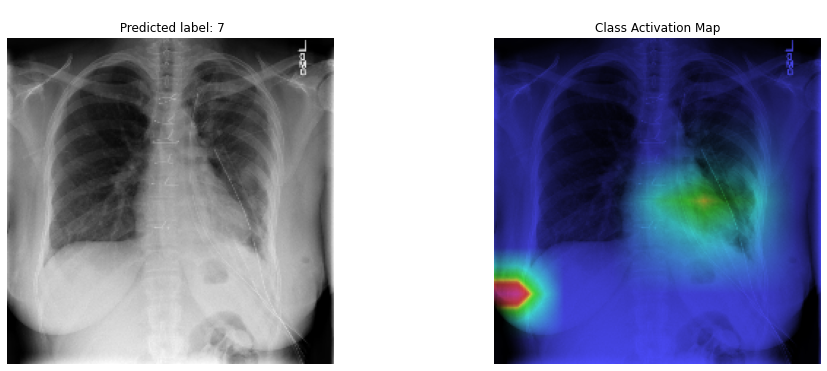

*********************************************************************************
The image 00014870_004.png
14-DIMENTIONAL Vector of Pathology values :
[0.20632304 0.00532044 0.1925385  0.2101649  0.01799466 0.02481146
 0.01860164 0.0368881  0.11136743 0.00975858 0.01027491 0.01126623
 0.0307549  0.00132373]
Actual pathology: Mass|Atelectasis
 
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.2101649]
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.20632304]
 
*********************************************************************************
The image 00025221_001.png
14-DIMENTIONAL Vector of Pathology values :
[0.0562146  0.0020904  0.00520706 0.03646432 0.00150665 0.00843265
 0.00102535 0.03978538 0.0060833  0.00584885 0.00736359 0.00055
 0.0015097  0.00061416]
Actual pathology: Atelectasis
 
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.0562146]
 


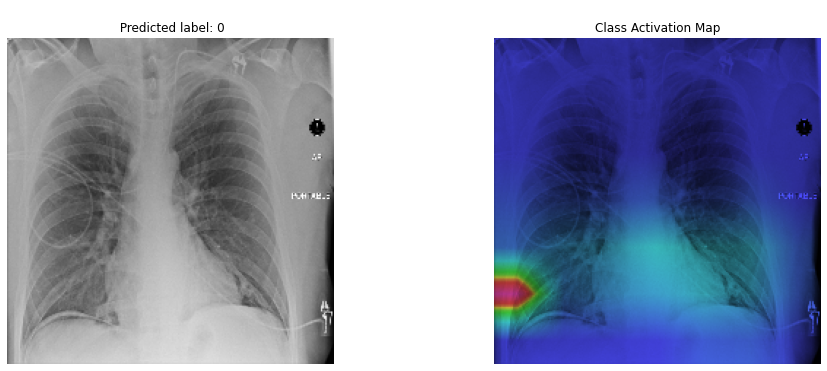

*********************************************************************************
The image 00018253_017.png
14-DIMENTIONAL Vector of Pathology values :
[0.04111451 0.0039206  0.10308726 0.13036117 0.00910229 0.02020033
 0.00513085 0.0097598  0.02061152 0.00469375 0.00261584 0.0056845
 0.02766823 0.00030805]
Actual pathology: Atelectasis|Effusion
 
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.13036117]
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.10308726]
 
*********************************************************************************
The image 00019373_036.png
14-DIMENTIONAL Vector of Pathology values :
[8.86653215e-02 1.92198753e-02 3.17063332e-01 1.42990902e-01
 1.14452295e-01 6.31516278e-02 6.11530570e-03 2.20274523e-01
 7.05984160e-02 7.21748499e-03 3.77271064e-02 4.08290699e-03
 5.27722947e-02 9.47842054e-05]
Actual pathology: Atelectasis|Consolidation|Emphysema|Mass|Nodule|Pleural_Thickening|Pneumo

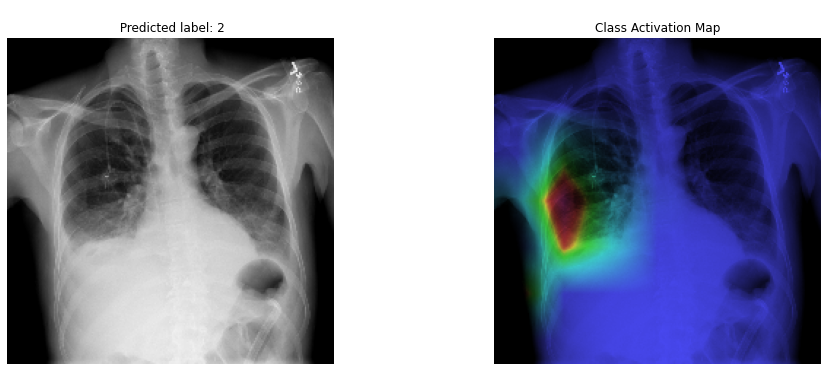

*********************************************************************************
The image 00016009_008.png
14-DIMENTIONAL Vector of Pathology values :
[1.1355129e-01 6.6453293e-03 9.4537556e-02 2.6136270e-01 7.0656384e-03
 4.6673240e-03 8.9571597e-03 1.2558709e-01 7.0551544e-02 2.5931628e-02
 3.6598708e-02 6.6253729e-04 5.7661892e-03 1.8430494e-06]
Actual pathology: Atelectasis|Pneumothorax
 
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.2613627]
The Predicted Label No is 7
Predicted pathology:Pneumothorax
The value predicted = [0.12558709]
 
*********************************************************************************
The image 00013111_069.png
14-DIMENTIONAL Vector of Pathology values :
[6.5173879e-02 5.1600859e-04 3.3403277e-02 7.2692744e-02 2.2480598e-02
 1.5110328e-02 2.5268146e-03 4.3636420e-01 2.2374149e-02 4.6311980e-04
 5.0226849e-01 3.5599081e-03 2.0259494e-02 2.7823780e-04]
Actual pathology: Atelectasis|Emphysema|Infiltration
 
T

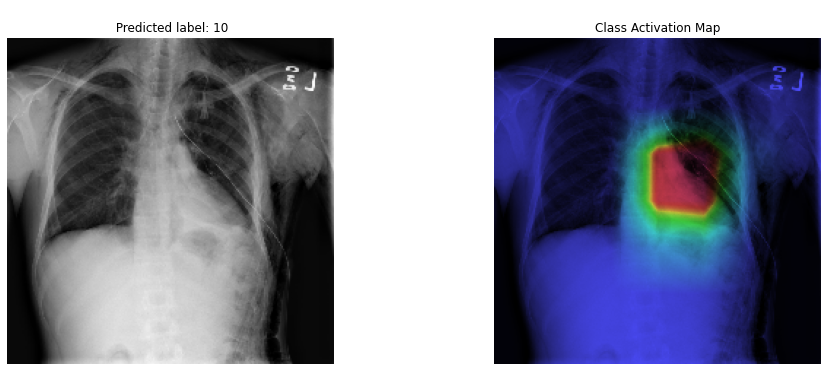

*********************************************************************************
The image 00023156_001.png
14-DIMENTIONAL Vector of Pathology values :
[4.8079703e-02 4.9568241e-04 5.4285962e-02 8.6802930e-02 1.7136861e-02
 2.0644018e-02 2.0190543e-03 5.5060607e-01 2.4163840e-02 1.1298385e-03
 8.1873804e-02 2.6359777e-03 2.2595320e-02 1.5411469e-04]
Actual pathology: Atelectasis
 
The Predicted Label No is 7
Predicted pathology:Pneumothorax
The value predicted = [0.5506061]
 
*********************************************************************************
The image 00013508_001.png
14-DIMENTIONAL Vector of Pathology values :
[1.29284233e-01 3.35663254e-03 6.77477270e-02 2.66959697e-01
 1.08181037e-01 1.17088124e-01 1.92355961e-02 7.59768337e-02
 1.00651339e-01 1.40235974e-02 6.47975178e-03 1.10816688e-03
 8.80156085e-03 2.30047634e-04]
Actual pathology: Atelectasis|Nodule|Mass
 
The Predicted Label No is 3
Predicted pathology:Infiltration
The value predicted = [0.2669597]
The Predict

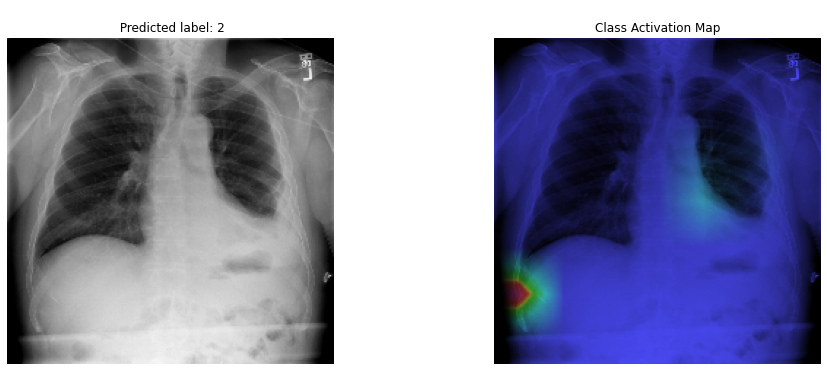

*********************************************************************************
The image 00017582_003.png
14-DIMENTIONAL Vector of Pathology values :
[3.2606685e-01 1.1494099e-03 1.1208406e-01 4.7536433e-02 7.8082052e-03
 1.0283515e-02 1.2618828e-03 1.5968898e-02 2.9053608e-02 2.6209711e-03
 8.2094604e-03 1.1560236e-03 7.3957820e-03 7.7666795e-05]
Actual pathology: Atelectasis|Effusion
 
The Predicted Label No is 0
Predicted pathology:Atelectasis
The value predicted = [0.32606685]
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.11208406]
 


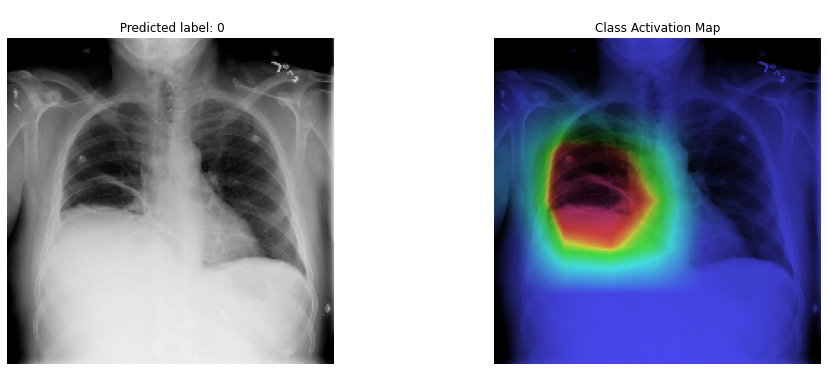

*********************************************************************************
The image 00009619_000.png
14-DIMENTIONAL Vector of Pathology values :
[3.7034359e-02 1.2606759e-04 1.0186986e-02 3.4469280e-02 6.6359913e-01
 9.4834790e-02 1.3449622e-03 3.1524964e-02 1.4768087e-02 6.3861511e-04
 1.9290356e-02 6.3217938e-04 3.8148491e-03 7.1107375e-04]
Actual pathology: Atelectasis
 
The Predicted Label No is 4
Predicted pathology:Mass
The value predicted = [0.66359913]
 
*********************************************************************************
The image 00009437_008.png
14-DIMENTIONAL Vector of Pathology values :
[1.4694369e-01 1.5380930e-03 7.2295129e-01 4.9208291e-02 1.5769672e-02
 1.2126172e-02 1.2476656e-03 3.2604810e-02 2.0301754e-02 1.3561163e-03
 1.0328294e-02 1.3629989e-03 2.7359093e-02 2.4341978e-06]
Actual pathology: Atelectasis|Effusion
 
The Predicted Label No is 2
Predicted pathology:Effusion
The value predicted = [0.7229513]
The Predicted Label No is 0
Predicted pa

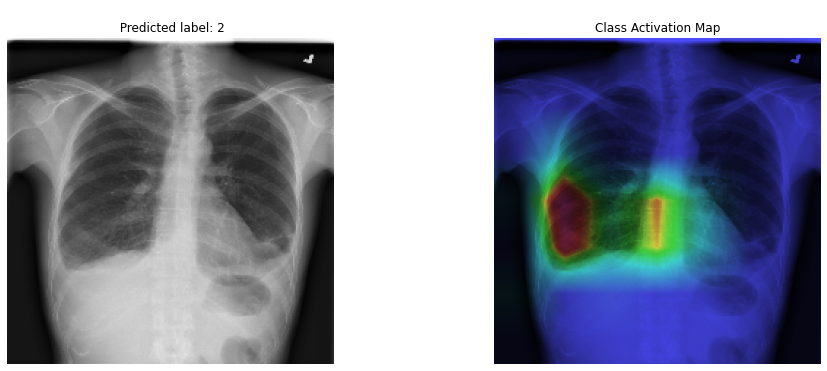

In [25]:
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
import numpy as np
import csv


model_factory = ModelFactory()
model = model_factory.get_model(
    class_names,
    model_name=base_model_name,
    use_base_weights=True,
    weights_path=model_weights_file,
    input_shape=(224, 224, 3))


for i in imfile:
    img_index=i[-16:]
    print("*********************************************************************************")
    print("The image {}".format(i[-16:]))
    sample_image = cv2.imread(i)
    # pre-process the image
    sample_image = cv2.resize(sample_image,(224,224))


    if sample_image.shape[2] ==1:
                sample_image = np.dstack([sample_image, sample_image, sample_image])
    sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)
    sample_image = sample_image.astype(np.float32)/255.
    #sample_label = np.argmax(val_gen, axis=-1)


    sample_image_processed = np.expand_dims(sample_image, axis=0)[0]
    sample_image_processed=sample_image_processed.reshape(-1, 224, 224, 3)
    # get the label predicted by our original model
    pred_label = np.argmax(model.predict(sample_image_processed), axis=-1)[0]
    
    
        
        

    pred_all_label=model.predict(sample_image_processed)
    print("14-DIMENTIONAL Vector of Pathology values :")
    print(pred_all_label[0])
    # spliting numpy into seperate dimensional
    x=pred_all_label[0]
    act_pat_list=np.array_split(x, 14)

    # creating a list of all 14 disease predictions
    lis=[]
    for k in range(14):
        lis.append(act_pat_list[k])
    lis2 = list(lis)

    #getting disease name matched with value predicted by model
    key_list = list(prediction_labels.keys())
    val_list = list(prediction_labels.values())

    position = val_list.index(pred_label)
    pred_pathology= key_list[position]

    with open(r"C:\Users\Vignesh\ML\data\Data_Entry_2017.csv",'r') as csvfile:
        csvreader = csv.reader(csvfile)
        for row in csvreader:
            if(row[0]==img_index):
                actual_pathology=row[1]
                #actual pathologes from dataset
                act_pat_list=actual_pathology.split('|')
                print("Actual pathology: " + actual_pathology)
                print(" ")
                act_pat_list_len=len(act_pat_list)
                #sorting accoring to highest predicted 
                lis.sort()
                lis.reverse()

                #printing only the number of diseases present 
                j=0
                while(j<act_pat_list_len):
                    pos2=lis2.index(lis[j])
                    print("The Predicted Label No is {}".format(lis2.index(lis[j])))
                    print("Predicted pathology:" + key_list[pos2])
                    print("The value predicted = {}".format(lis[j]))
                    j+=1




    # get the heatmap for class activation map(CAM)
    print(" ")
    #only heatmap for correct responses
    if(pred_pathology in act_pat_list):

        heatmap = get_heatmap(sample_image_processed, pred_label)
        heatmap = cv2.resize(heatmap, (sample_image.shape[0], sample_image.shape[1]))
        heatmap = heatmap *255
        heatmap = np.clip(heatmap, 0, 255).astype(np.uint8)
        heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_RAINBOW)
        #superimpose the heatmap on the image    

        sample_image_hsv = color.rgb2hsv(sample_image)
        heatmap = color.rgb2hsv(heatmap)

        alpha=0.7
        sample_image_hsv[..., 0] = heatmap[..., 0]
        sample_image_hsv[..., 1] = heatmap[..., 1] * alpha

        img_masked = color.hsv2rgb(sample_image_hsv)

        f,ax = plt.subplots(1,2, figsize=(16,6))
        ax[0].imshow(sample_image)
        ax[0].set_title(f" \n Predicted label: {pred_label}")
        ax[0].axis('off')

        ax[1].imshow(img_masked)
        ax[1].set_title("Class Activation Map")
        ax[1].axis('off')

        plt.show()
